# Project: Identify Customer Segments

In this project, you will apply unsupervised learning techniques to identify segments of the population that form the core customer base for a mail-order sales company in Germany. These segments can then be used to direct marketing campaigns towards audiences that will have the highest expected rate of returns. The data that you will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task.

This notebook will help you complete this task by providing a framework within which you will perform your analysis steps. In each step of the project, you will see some text describing the subtask that you will perform, followed by one or more code cells for you to complete your work. **Feel free to add additional code and markdown cells as you go along so that you can explore everything in precise chunks.** The code cells provided in the base template will outline only the major tasks, and will usually not be enough to cover all of the minor tasks that comprise it.

It should be noted that while there will be precise guidelines on how you should handle certain tasks in the project, there will also be places where an exact specification is not provided. **There will be times in the project where you will need to make and justify your own decisions on how to treat the data.** These are places where there may not be only one way to handle the data. In real-life tasks, there may be many valid ways to approach an analysis task. One of the most important things you can do is clearly document your approach so that other scientists can understand the decisions you've made.

At the end of most sections, there will be a Markdown cell labeled **Discussion**. In these cells, you will report your findings for the completed section, as well as document the decisions that you made in your approach to each subtask. **Your project will be evaluated not just on the code used to complete the tasks outlined, but also your communication about your observations and conclusions at each stage.**

In [1]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# magic word for producing visualizations in notebook
%matplotlib inline

### Step 0: Load the Data

There are four files associated with this project (not including this one):

- `Udacity_AZDIAS_Subset.csv`: Demographics data for the general population of Germany; 891211 persons (rows) x 85 features (columns).
- `Udacity_CUSTOMERS_Subset.csv`: Demographics data for customers of a mail-order company; 191652 persons (rows) x 85 features (columns).
- `Data_Dictionary.md`: Detailed information file about the features in the provided datasets.
- `AZDIAS_Feature_Summary.csv`: Summary of feature attributes for demographics data; 85 features (rows) x 4 columns

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. You will use this information to cluster the general population into groups with similar demographic properties. Then, you will see how the people in the customers dataset fit into those created clusters. The hope here is that certain clusters are over-represented in the customers data, as compared to the general population; those over-represented clusters will be assumed to be part of the core userbase. This information can then be used for further applications, such as targeting for a marketing campaign.

To start off with, load in the demographics data for the general population into a pandas DataFrame, and do the same for the feature attributes summary. Note for all of the `.csv` data files in this project: they're semicolon (`;`) delimited, so you'll need an additional argument in your [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call to read in the data properly. Also, considering the size of the main dataset, it may take some time for it to load completely.

Once the dataset is loaded, it's recommended that you take a little bit of time just browsing the general structure of the dataset and feature summary file. You'll be getting deep into the innards of the cleaning in the first major step of the project, so gaining some general familiarity can help you get your bearings.

In [2]:
# Load in the general demographics data.
azdias = pd.read_csv("Udacity_AZDIAS_Subset.csv", sep=';')

# Load in the feature summary file.
feat_info = pd.read_csv("AZDIAS_Feature_Summary.csv", sep=';')

In [3]:
# Check the structure of the general demographic data after it's loaded (e.g. print the number of
# rows and columns, print the first few rows).
print(azdias.head())
print('Shape')
print(azdias.shape)

   AGER_TYP  ALTERSKATEGORIE_GROB  ANREDE_KZ  CJT_GESAMTTYP  \
0        -1                     2          1            2.0   
1        -1                     1          2            5.0   
2        -1                     3          2            3.0   
3         2                     4          2            2.0   
4        -1                     3          1            5.0   

   FINANZ_MINIMALIST  FINANZ_SPARER  FINANZ_VORSORGER  FINANZ_ANLEGER  \
0                  3              4                 3               5   
1                  1              5                 2               5   
2                  1              4                 1               2   
3                  4              2                 5               2   
4                  4              3                 4               1   

   FINANZ_UNAUFFAELLIGER  FINANZ_HAUSBAUER    ...     PLZ8_ANTG1  PLZ8_ANTG2  \
0                      5                 3    ...            NaN         NaN   
1                     

In [4]:
azdias.describe()

,AGER_TYP,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,...,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
count,891221.000000,891221.000000,891221.000000,886367.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,...,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,794005.000000,794005.000000,794005.00000
mean,-0.358435,2.777398,1.522098,3.632838,3.074528,2.821039,3.401106,3.033328,2.874167,3.075121,...,2.253330,2.801858,1.595426,0.699166,1.943913,3.612821,3.381087,3.167854,5.293002,3.07222
std,1.198724,1.068775,0.499512,1.595021,1.321055,1.464749,1.322134,1.529603,1.486731,1.353248,...,0.972008,0.920309,0.986736,0.727137,1.459654,0.973967,1.111598,1.002376,2.303739,1.36298
min,-1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.00000
25%,-1.000000,2.000000,1.000000,2.000000,2.000000,1.000000,3.000000,2.000000,2.000000,2.000000,...,1.000000,2.000000,1.000000,0.000000,1.000000,3.000000,3.000000,3.000000,4.000000,2.00000
50%,-1.000000,3.000000,2.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,2.000000,3.000000,2.000000,1.000000,1.000000,4.000000,3.000000,3.000000,5.000000,3.00000
75%,-1.000000,4.000000,2.000000,5.000000,4.000000,4.000000,5.000000,5.000000,4.000000,4.000000,...,3.000000,3.000000,2.000000,1.000000,3.000000,4.000000,4.000000,4.000000,7.000000,4.00000
max,3.000000,9.000000,2.000000,6.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,4.000000,4.000000,3.000000,2.000000,5.000000,5.000000,5.000000,9.000000,9.000000,9.00000


In [5]:
# Check the structure of the feature summary data after it's loaded (e.g. print the number of
# rows and columns, print the first few rows).
print(feat_info.head())
print('Shape')
print(feat_info.shape)

              attribute information_level         type missing_or_unknown
0              AGER_TYP            person  categorical             [-1,0]
1  ALTERSKATEGORIE_GROB            person      ordinal           [-1,0,9]
2             ANREDE_KZ            person  categorical             [-1,0]
3         CJT_GESAMTTYP            person  categorical                [0]
4     FINANZ_MINIMALIST            person      ordinal               [-1]
Shape
(85, 4)


In [6]:
feat_info_missing = feat_info[['attribute', 'missing_or_unknown']]
print(feat_info_missing.head())

              attribute missing_or_unknown
0              AGER_TYP             [-1,0]
1  ALTERSKATEGORIE_GROB           [-1,0,9]
2             ANREDE_KZ             [-1,0]
3         CJT_GESAMTTYP                [0]
4     FINANZ_MINIMALIST               [-1]


> **Tip**: Add additional cells to keep everything in reasonably-sized chunks! Keyboard shortcut `esc --> a` (press escape to enter command mode, then press the 'A' key) adds a new cell before the active cell, and `esc --> b` adds a new cell after the active cell. If you need to convert an active cell to a markdown cell, use `esc --> m` and to convert to a code cell, use `esc --> y`. 

## Step 1: Preprocessing

### Step 1.1: Assess Missing Data

The feature summary file contains a summary of properties for each demographics data column. You will use this file to help you make cleaning decisions during this stage of the project. First of all, you should assess the demographics data in terms of missing data. Pay attention to the following points as you perform your analysis, and take notes on what you observe. Make sure that you fill in the **Discussion** cell with your findings and decisions at the end of each step that has one!

#### Step 1.1.1: Convert Missing Value Codes to NaNs
The fourth column of the feature attributes summary (loaded in above as `feat_info`) documents the codes from the data dictionary that indicate missing or unknown data. While the file encodes this as a list (e.g. `[-1,0]`), this will get read in as a string object. You'll need to do a little bit of parsing to make use of it to identify and clean the data. Convert data that matches a 'missing' or 'unknown' value code into a numpy NaN value. You might want to see how much data takes on a 'missing' or 'unknown' code, and how much data is naturally missing, as a point of interest.

**As one more reminder, you are encouraged to add additional cells to break up your analysis into manageable chunks.**

In [7]:
print(azdias.shape[0] * .2)

178244.2


In [8]:
print(azdias.head())

   AGER_TYP  ALTERSKATEGORIE_GROB  ANREDE_KZ  CJT_GESAMTTYP  \
0        -1                     2          1            2.0   
1        -1                     1          2            5.0   
2        -1                     3          2            3.0   
3         2                     4          2            2.0   
4        -1                     3          1            5.0   

   FINANZ_MINIMALIST  FINANZ_SPARER  FINANZ_VORSORGER  FINANZ_ANLEGER  \
0                  3              4                 3               5   
1                  1              5                 2               5   
2                  1              4                 1               2   
3                  4              2                 5               2   
4                  4              3                 4               1   

   FINANZ_UNAUFFAELLIGER  FINANZ_HAUSBAUER    ...     PLZ8_ANTG1  PLZ8_ANTG2  \
0                      5                 3    ...            NaN         NaN   
1                     

In [9]:
# Identify missing or unknown data values and convert them to NaNs.
print(feat_info_missing.loc[feat_info_missing['attribute'] == 'AGER_TYP'])
test1 = feat_info_missing.loc[feat_info_missing['attribute'] == 'ANREDE_KZ']
print(test1['missing_or_unknown'][2])


  attribute missing_or_unknown
0  AGER_TYP             [-1,0]
[-1,0]


In [10]:
# find out the different kind of encodings
feat_info.missing_or_unknown.unique()

array(['[-1,0]', '[-1,0,9]', '[0]', '[-1]', '[]', '[-1,9]', '[-1,X]',
       '[XX]', '[-1,XX]'], dtype=object)

In [11]:
def obtain_missing_info(test):
    if('[-1,0]' == test):
        return [-1,0]
    if('[-1,0,9]' == test):
        return [-1,0,9]
    if('[0]' == test):
        return [0]
    if('[-1]' == test):
        return [-1]
    if('[-1,9]' == test):
        return [-1,9]
    if('[-1,X]' == test):
        return [-1,'X']
    if('[XX]' == test):
        return ['XX']
    if('[-1,XX]' == test):
        return [-1,'XX']

In [12]:
counter = 0
for x in azdias.iteritems():
    col_name = feat_info_missing.loc[feat_info_missing['attribute'] == x[0]]
    missing = col_name['missing_or_unknown'][counter]
    counter = counter + 1
    if(len(missing) > 2):
        azdias[x[0]] = azdias[x[0]].replace(obtain_missing_info(missing), np.NaN)   

In [13]:
print(azdias[:20])

    AGER_TYP  ALTERSKATEGORIE_GROB  ANREDE_KZ  CJT_GESAMTTYP  \
0        NaN                   2.0          1            2.0   
1        NaN                   1.0          2            5.0   
2        NaN                   3.0          2            3.0   
3        2.0                   4.0          2            2.0   
4        NaN                   3.0          1            5.0   
5        3.0                   1.0          2            2.0   
6        NaN                   2.0          2            5.0   
7        NaN                   1.0          1            3.0   
8        NaN                   3.0          1            3.0   
9        NaN                   3.0          2            4.0   
10       NaN                   3.0          2            1.0   
11       NaN                   2.0          1            6.0   
12       NaN                   3.0          1            6.0   
13       NaN                   1.0          2            5.0   
14       NaN                   3.0      

#### Step 1.1.2: Assess Missing Data in Each Column

How much missing data is present in each column? There are a few columns that are outliers in terms of the proportion of values that are missing. You will want to use matplotlib's [`hist()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html) function to visualize the distribution of missing value counts to find these columns. Identify and document these columns. While some of these columns might have justifications for keeping or re-encoding the data, for this project you should just remove them from the dataframe. (Feel free to make remarks about these outlier columns in the discussion, however!)

For the remaining features, are there any patterns in which columns have, or share, missing data?

AGER_TYP
685843
ALTERSKATEGORIE_GROB
2881
CJT_GESAMTTYP
4854
GEBURTSJAHR
392318
GFK_URLAUBERTYP
4854
HEALTH_TYP
111196
LP_LEBENSPHASE_FEIN
97632
LP_LEBENSPHASE_GROB
94572
LP_FAMILIE_FEIN
77792
LP_FAMILIE_GROB
77792
LP_STATUS_FEIN
4854
LP_STATUS_GROB
4854
NATIONALITAET_KZ
108315
PRAEGENDE_JUGENDJAHRE
108164
RETOURTYP_BK_S
4854
SHOPPER_TYP
111196
SOHO_KZ
73499
TITEL_KZ
889061
VERS_TYP
111196
ALTER_HH
310267
ANZ_PERSONEN
73499
ANZ_TITEL
73499
HH_EINKOMMEN_SCORE
18348
KK_KUNDENTYP
584612
W_KEIT_KIND_HH
147988
WOHNDAUER_2008
73499
ANZ_HAUSHALTE_AKTIV
99611
ANZ_HH_TITEL
97008
GEBAEUDETYP
93148
KONSUMNAEHE
73969
MIN_GEBAEUDEJAHR
93148
OST_WEST_KZ
93148
WOHNLAGE
93148
CAMEO_DEUG_2015
99352
CAMEO_DEU_2015
99352
CAMEO_INTL_2015
99352
KBA05_ANTG1
133324
KBA05_ANTG2
133324
KBA05_ANTG3
133324
KBA05_ANTG4
133324
KBA05_BAUMAX
476524
KBA05_GBZ
133324
BALLRAUM
93740
EWDICHTE
93740
INNENSTADT
93740
GEBAEUDETYP_RASTER
93155
KKK
158064
MOBI_REGIO
133324
ONLINE_AFFINITAET
4854
REGIOTYP
158064
KBA13_ANZAHL_

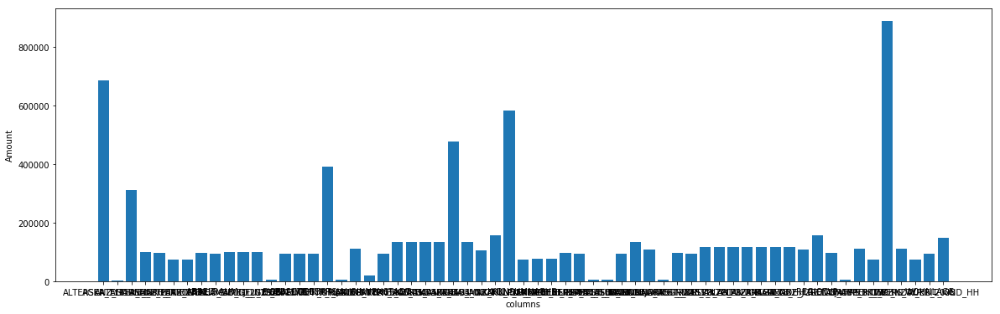

In [14]:
# Perform an assessment of how much missing data there is in each column of the
# dataset.
column_dict = {}
for column in azdias:
    counts = azdias[column].isnull().sum()
    if(counts > 0):
        column_dict[column] = counts
        print(column)
        print(counts)
print(len(azdias.columns))
plt.figure(figsize=(20,6))
plt.bar(column_dict.keys(), column_dict.values())
plt.xlabel('columns')
plt.ylabel('Amount')
plt.show()

# Investigate patterns in the amount of missing data in each column.

It appears that a majority have roughly 200K or below in terms of NaN.  
I will be removing the outliers that have more than 200,000 in NAN



In [15]:
#Listed below are the names of the columns that have more than 200K NaN
print(azdias.keys())

Index(['AGER_TYP', 'ALTERSKATEGORIE_GROB', 'ANREDE_KZ', 'CJT_GESAMTTYP',
       'FINANZ_MINIMALIST', 'FINANZ_SPARER', 'FINANZ_VORSORGER',
       'FINANZ_ANLEGER', 'FINANZ_UNAUFFAELLIGER', 'FINANZ_HAUSBAUER',
       'FINANZTYP', 'GEBURTSJAHR', 'GFK_URLAUBERTYP', 'GREEN_AVANTGARDE',
       'HEALTH_TYP', 'LP_LEBENSPHASE_FEIN', 'LP_LEBENSPHASE_GROB',
       'LP_FAMILIE_FEIN', 'LP_FAMILIE_GROB', 'LP_STATUS_FEIN',
       'LP_STATUS_GROB', 'NATIONALITAET_KZ', 'PRAEGENDE_JUGENDJAHRE',
       'RETOURTYP_BK_S', 'SEMIO_SOZ', 'SEMIO_FAM', 'SEMIO_REL', 'SEMIO_MAT',
       'SEMIO_VERT', 'SEMIO_LUST', 'SEMIO_ERL', 'SEMIO_KULT', 'SEMIO_RAT',
       'SEMIO_KRIT', 'SEMIO_DOM', 'SEMIO_KAEM', 'SEMIO_PFLICHT', 'SEMIO_TRADV',
       'SHOPPER_TYP', 'SOHO_KZ', 'TITEL_KZ', 'VERS_TYP', 'ZABEOTYP',
       'ALTER_HH', 'ANZ_PERSONEN', 'ANZ_TITEL', 'HH_EINKOMMEN_SCORE',
       'KK_KUNDENTYP', 'W_KEIT_KIND_HH', 'WOHNDAUER_2008',
       'ANZ_HAUSHALTE_AKTIV', 'ANZ_HH_TITEL', 'GEBAEUDETYP', 'KONSUMNAEHE',
       'MIN_

In [16]:
# Remove the outlier columns from the dataset. (You'll perform other data
# engineering tasks such as re-encoding and imputation later.)
for column in azdias:
    counts = azdias[column].isnull().sum()
    if(counts >= (azdias.shape[0] * .2)):
        print(column)
        print(counts)
        azdias = azdias.drop(column, axis=1)
print(len(azdias.columns))
print(azdias.shape)

AGER_TYP
685843
GEBURTSJAHR
392318
TITEL_KZ
889061
ALTER_HH
310267
KK_KUNDENTYP
584612
KBA05_BAUMAX
476524
79
(891221, 79)


#### Discussion 1.1.2: Assess Missing Data in Each Column

There were 6 columns that were removed as they had more than 30% of their values missing (NaN).
- AGER_TYP:  This catered only to the different types of eldery.  This does not consider types of non-elderly consumers.
- GEBURTSJAHR: Only shows year of birth.  However, similar columns could be used for the same type of data.  
- TITEL_KZ: This catered only to the different types of academic titles.  This does not consider types of non-academic titles.
- ALTER_HH: Since this is talking about the head of household and not the actual consumer (some instances it could be the same person), I do not think that this would prove valuable
- KK_KUNDENTYP: This might have potentially had some useful information since it involved consumer patterns.  However, was roughly 65% of data missing in this column.
- KBA05_BAUMAX: The values of this column could be determined from KBA05_ANTG1, KBA05_ANTG2, KBA05_ANTG3 columns


In terms of the columns that were not over the 20% in NaN, I did discover some similarities in the totals.  Typically columns that reported on similar data (for instance, LP_FAMILIE_FEIN and LP_FAMILIE_GROB) had exactly the same amount of NaN.  this goes for many other columns as well.

#### Step 1.1.3: Assess Missing Data in Each Row

Now, you'll perform a similar assessment for the rows of the dataset. How much data is missing in each row? As with the columns, you should see some groups of points that have a very different numbers of missing values. Divide the data into two subsets: one for data points that are above some threshold for missing values, and a second subset for points below that threshold.

In order to know what to do with the outlier rows, we should see if the distribution of data values on columns that are not missing data (or are missing very little data) are similar or different between the two groups. Select at least five of these columns and compare the distribution of values.
- You can use seaborn's [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html) function to create a bar chart of code frequencies and matplotlib's [`subplot()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplot.html) function to put bar charts for the two subplots side by side.
- To reduce repeated code, you might want to write a function that can perform this comparison, taking as one of its arguments a column to be compared.

Depending on what you observe in your comparison, this will have implications on how you approach your conclusions later in the analysis. If the distributions of non-missing features look similar between the data with many missing values and the data with few or no missing values, then we could argue that simply dropping those points from the analysis won't present a major issue. On the other hand, if the data with many missing values looks very different from the data with few or no missing values, then we should make a note on those data as special. Make sure you report your observations in the discussion section. **Either way, you should continue your analysis below using just the subset of the data with few or no missing values.**

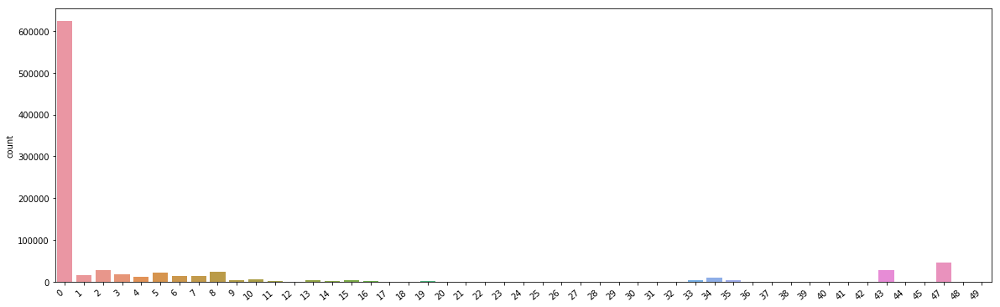

In [17]:
# How much data is missing in each row of the dataset?
has_nulls = azdias.isnull().sum(axis=1) 
plt.figure(figsize=(20,6))
ax = sns.countplot(has_nulls)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

In [18]:
# Write code to divide the data into two subsets based on the number of missing
# values in each row.

#Group_1 has the NA that has less than 15 N/A
#group_1 = pd.DataFrame(columns=list(azdias))
#Group_2 has the NA that has more than 15 or more N/A
#group_2 = pd.DataFrame(columns=list(azdias))

missing_row_data = azdias.isnull().sum(axis=1)
threshold = 15
group_2 = azdias[missing_row_data > threshold]
group_1 = azdias[missing_row_data <= threshold]

azdias = azdias.assign(Count_NA = lambda x: x.isnull().sum(axis=1)).sort_values('Count_NA', ascending=False).drop('Count_NA', axis=1)

In [19]:
print(azdias[103677:103678].isnull().sum().sum())

14


In [20]:
group_1 = azdias[103678:]
group_2 = azdias[0:103678]
print('Azdias shape')
print(azdias.shape)
print('Group 1 shape')
print(group_1.shape)
print('Group 2 shape')
print(group_2.shape)

Azdias shape
(891221, 79)
Group 1 shape
(787543, 79)
Group 2 shape
(103678, 79)


In [21]:
print(group_2.head())

        ALTERSKATEGORIE_GROB  ANREDE_KZ  CJT_GESAMTTYP  FINANZ_MINIMALIST  \
732775                   3.0          2            NaN                  3   
643174                   3.0          1            NaN                  2   
472919                   1.0          1            NaN                  5   
345274                   1.0          2            6.0                  3   
299868                   2.0          2            6.0                  3   

        FINANZ_SPARER  FINANZ_VORSORGER  FINANZ_ANLEGER  \
732775              5                 3               5   
643174              5                 3               5   
472919              1                 5               2   
345274              4                 3               5   
299868              4                 3               5   

        FINANZ_UNAUFFAELLIGER  FINANZ_HAUSBAUER  FINANZTYP    ...     \
732775                      5                 2          4    ...      
643174                      5         

In [22]:
#Determining columns that have under 5K NaN
column_names = []
for column in azdias:
    counts = azdias[column].isnull().sum()
    if(counts < 5000):
        column_names.append(column)
        print(column)
        print(counts)

ALTERSKATEGORIE_GROB
2881
ANREDE_KZ
0
CJT_GESAMTTYP
4854
FINANZ_MINIMALIST
0
FINANZ_SPARER
0
FINANZ_VORSORGER
0
FINANZ_ANLEGER
0
FINANZ_UNAUFFAELLIGER
0
FINANZ_HAUSBAUER
0
FINANZTYP
0
GFK_URLAUBERTYP
4854
GREEN_AVANTGARDE
0
LP_STATUS_FEIN
4854
LP_STATUS_GROB
4854
RETOURTYP_BK_S
4854
SEMIO_SOZ
0
SEMIO_FAM
0
SEMIO_REL
0
SEMIO_MAT
0
SEMIO_VERT
0
SEMIO_LUST
0
SEMIO_ERL
0
SEMIO_KULT
0
SEMIO_RAT
0
SEMIO_KRIT
0
SEMIO_DOM
0
SEMIO_KAEM
0
SEMIO_PFLICHT
0
SEMIO_TRADV
0
ZABEOTYP
0
ONLINE_AFFINITAET
4854


In [23]:
#Choosing the following 5 columns as they are under 5K in NaN
top_5_columns = ['CJT_GESAMTTYP', 'FINANZ_SPARER', 'GFK_URLAUBERTYP', 'LP_STATUS_FEIN', 'SEMIO_VERT']

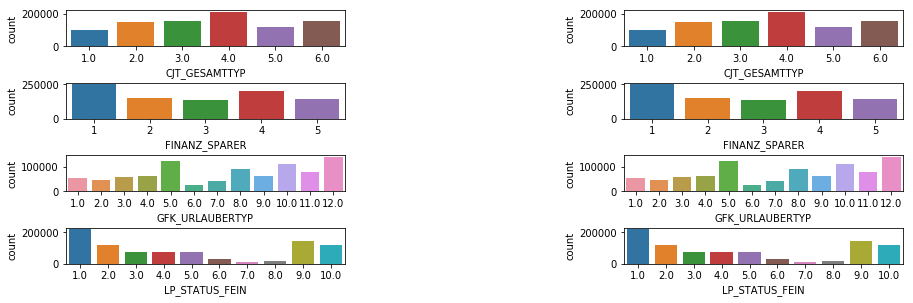

In [24]:
# Compare the distribution of values for at least five columns where there are
# no or few missing values, between the two subsets.
plt.figure(figsize=(15,6))
plt.subplots_adjust(wspace=1, hspace=1)
def print_graphs(columns, data_group_1, data_group_2):
    count = 1
    for y in range(0,len(top_5_columns) - 1):
        for z in range(1,3):
            plt.subplot(5, 2, count)
            count = count + 1
            if(z == 1):
                sns.countplot(x=azdias[columns[y]], data=data_group_1)                    
            else:
                sns.countplot(x=azdias[columns[y]], data=data_group_2)
    plt.show()
        
print_graphs(top_5_columns, group_1, group_2)

In [25]:
#For the simplicity of this project, I  am dropping rows of data 
print(azdias.shape)
azdias = azdias.dropna(axis=0, inplace=False)
print(azdias.shape)

(891221, 79)
(623209, 79)


#### Discussion 1.1.3: Assess Missing Data in Each Row

Strangely enough, it does not look like there is a difference between the two

### Step 1.2: Select and Re-Encode Features

Checking for missing data isn't the only way in which you can prepare a dataset for analysis. Since the unsupervised learning techniques to be used will only work on data that is encoded numerically, you need to make a few encoding changes or additional assumptions to be able to make progress. In addition, while almost all of the values in the dataset are encoded using numbers, not all of them represent numeric values. Check the third column of the feature summary (`feat_info`) for a summary of types of measurement.
- For numeric and interval data, these features can be kept without changes.
- Most of the variables in the dataset are ordinal in nature. While ordinal values may technically be non-linear in spacing, make the simplifying assumption that the ordinal variables can be treated as being interval in nature (that is, kept without any changes).
- Special handling may be necessary for the remaining two variable types: categorical, and 'mixed'.

In the first two parts of this sub-step, you will perform an investigation of the categorical and mixed-type features and make a decision on each of them, whether you will keep, drop, or re-encode each. Then, in the last part, you will create a new data frame with only the selected and engineered columns.

Data wrangling is often the trickiest part of the data analysis process, and there's a lot of it to be done here. But stick with it: once you're done with this step, you'll be ready to get to the machine learning parts of the project!

In [26]:
print('Testing the feature_info column')
print(feat_info)

Testing the feature_info column
                attribute information_level         type missing_or_unknown
0                AGER_TYP            person  categorical             [-1,0]
1    ALTERSKATEGORIE_GROB            person      ordinal           [-1,0,9]
2               ANREDE_KZ            person  categorical             [-1,0]
3           CJT_GESAMTTYP            person  categorical                [0]
4       FINANZ_MINIMALIST            person      ordinal               [-1]
5           FINANZ_SPARER            person      ordinal               [-1]
6        FINANZ_VORSORGER            person      ordinal               [-1]
7          FINANZ_ANLEGER            person      ordinal               [-1]
8   FINANZ_UNAUFFAELLIGER            person      ordinal               [-1]
9        FINANZ_HAUSBAUER            person      ordinal               [-1]
10              FINANZTYP            person  categorical               [-1]
11            GEBURTSJAHR            person      numeric

In [27]:
mixed = feat_info[feat_info['type'] == 'mixed']
print(len(mixed))
print(mixed)

7
                attribute information_level   type missing_or_unknown
15    LP_LEBENSPHASE_FEIN            person  mixed                [0]
16    LP_LEBENSPHASE_GROB            person  mixed                [0]
22  PRAEGENDE_JUGENDJAHRE            person  mixed             [-1,0]
56               WOHNLAGE          building  mixed               [-1]
59        CAMEO_INTL_2015     microcell_rr4  mixed            [-1,XX]
64           KBA05_BAUMAX     microcell_rr3  mixed             [-1,0]
79            PLZ8_BAUMAX    macrocell_plz8  mixed             [-1,0]


In [28]:
categorical = feat_info[feat_info['type'] == 'categorical']
print(len(categorical))
print(categorical)

21
           attribute information_level         type missing_or_unknown
0           AGER_TYP            person  categorical             [-1,0]
2          ANREDE_KZ            person  categorical             [-1,0]
3      CJT_GESAMTTYP            person  categorical                [0]
10         FINANZTYP            person  categorical               [-1]
12   GFK_URLAUBERTYP            person  categorical                 []
13  GREEN_AVANTGARDE            person  categorical                 []
17   LP_FAMILIE_FEIN            person  categorical                [0]
18   LP_FAMILIE_GROB            person  categorical                [0]
19    LP_STATUS_FEIN            person  categorical                [0]
20    LP_STATUS_GROB            person  categorical                [0]
21  NATIONALITAET_KZ            person  categorical             [-1,0]
38       SHOPPER_TYP            person  categorical               [-1]
39           SOHO_KZ            person  categorical               [-1]
40 

Based off of the cell above, we can see that we have the following categories:
- Mixed: 7
- Categorical: 21

#### Step 1.2.1: Re-Encode Categorical Features

For categorical data, you would ordinarily need to encode the levels as dummy variables. Depending on the number of categories, perform one of the following:
- For binary (two-level) categoricals that take numeric values, you can keep them without needing to do anything.
- There is one binary variable that takes on non-numeric values. For this one, you need to re-encode the values as numbers or create a dummy variable.
- For multi-level categoricals (three or more values), you can choose to encode the values using multiple dummy variables (e.g. via [OneHotEncoder](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html)), or (to keep things straightforward) just drop them from the analysis. As always, document your choices in the Discussion section.

In [29]:
# Assess categorical variables: which are binary, which are multi-level, and
# which one needs to be re-encoded?
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

In [30]:
azdias = azdias.drop('CJT_GESAMTTYP', axis=1)
azdias = azdias.drop('FINANZTYP', axis=1)
azdias = azdias.drop('GFK_URLAUBERTYP', axis=1)
azdias = azdias.drop('LP_FAMILIE_FEIN', axis=1)
azdias = azdias.drop('LP_FAMILIE_GROB', axis=1)
azdias = azdias.drop('LP_STATUS_FEIN', axis=1)
azdias = azdias.drop('LP_STATUS_GROB', axis=1)
azdias = azdias.drop('NATIONALITAET_KZ', axis=1)
azdias = azdias.drop('SHOPPER_TYP', axis=1)
azdias = azdias.drop('ZABEOTYP', axis=1)
azdias = azdias.drop('GEBAEUDETYP', axis=1)
azdias = azdias.drop('CAMEO_DEUG_2015', axis=1)
azdias = azdias.drop('CAMEO_DEU_2015', axis=1)

In [31]:
azdias['OST_WEST_KZ'] = azdias['OST_WEST_KZ'].replace({'O': 0, 
                                               'W': 1})

In [32]:
print(azdias['OST_WEST_KZ'].head())

604885    1
536670    1
604888    1
624663    0
853635    1
Name: OST_WEST_KZ, dtype: int64


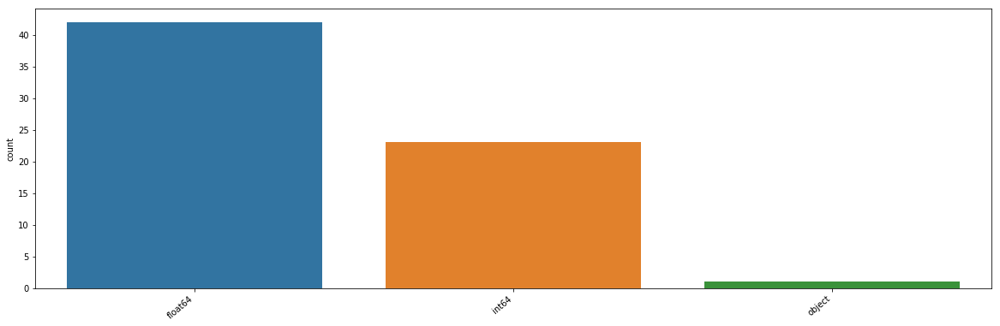

In [33]:
plt.figure(figsize=(20,6))
ax = sns.countplot(azdias.dtypes)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

#### Discussion 1.2.1: Re-Encode Categorical Features
Categorical:
             
- CJT_GESAMTTYP - Drop       
- FINANZTYP - Drop    
- GFK_URLAUBERTYP - Drop                
- LP_FAMILIE_FEIN - Drop  
- LP_FAMILIE_GROB - Drop        
- LP_STATUS_FEIN - Drop       
- LP_STATUS_GROB - Drop             
- NATIONALITAET_KZ - Drop          
- SHOPPER_TYP - Drop             
- TITEL_KZ - Drop      
- ZABEOTYP - Drop   
- KK_KUNDENTYP - Drop         
- GEBAEUDETYP - Drop             
- CAMEO_DEUG_2015 - Drop 
- CAMEO_DEU_2015 - Drop     

I have elected to drop the columns above due to simplicity

After evaluation, the following columns were kept as no work needed to be performed on them
- ANREDE_KZ   
- GREEN_AVANTGARDE   
- SOHO_KZ 
- VERS_TYP 

#### Step 1.2.2: Engineer Mixed-Type Features

There are a handful of features that are marked as "mixed" in the feature summary that require special treatment in order to be included in the analysis. There are two in particular that deserve attention; the handling of the rest are up to your own choices:
- "PRAEGENDE_JUGENDJAHRE" combines information on three dimensions: generation by decade, movement (mainstream vs. avantgarde), and nation (east vs. west). While there aren't enough levels to disentangle east from west, you should create two new variables to capture the other two dimensions: an interval-type variable for decade, and a binary variable for movement.
- "CAMEO_INTL_2015" combines information on two axes: wealth and life stage. Break up the two-digit codes by their 'tens'-place and 'ones'-place digits into two new ordinal variables (which, for the purposes of this project, is equivalent to just treating them as their raw numeric values).
- If you decide to keep or engineer new features around the other mixed-type features, make sure you note your steps in the Discussion section.

Be sure to check `Data_Dictionary.md` for the details needed to finish these tasks.

In [34]:
# Investigate "PRAEGENDE_JUGENDJAHRE" and engineer two new variables.
print('First few rows to understand what is in dataset')
print(azdias['PRAEGENDE_JUGENDJAHRE'].tail())
    
#Based off of what I am seeing in the documentation, there is nothing to modify on this

First few rows to understand what is in dataset
349047     8.0
349048    12.0
349049    12.0
349050    14.0
891220     3.0
Name: PRAEGENDE_JUGENDJAHRE, dtype: float64


In [35]:
# re-engineer PRAEGENDE_JUGENDJAHRE
decade_dict = {1: 1, 2: 1, 3: 2, 4: 2, 5: 3, 6: 3, 7:  3,
               8: 4, 9: 4, 10: 5, 11: 5, 12: 5, 13: 5,
               14: 6, 15: 6
              }
movement_dict = {1: 1, 3: 1, 5: 1, 8: 1, 10: 1, 12: 1, 14: 1,
                2: 2, 4: 2, 6: 2, 7: 2, 9: 2, 11: 2, 13: 2, 15: 2
                }

azdias['DECADE'] = azdias['PRAEGENDE_JUGENDJAHRE'].map(decade_dict)
azdias['MOVEMENT'] = azdias['PRAEGENDE_JUGENDJAHRE'].map(movement_dict)

In [36]:
# Investigate "CAMEO_INTL_2015" and engineer two new variables.
print('First few rows to understand what is in dataset')
print(azdias['CAMEO_INTL_2015'])

First few rows to understand what is in dataset
604885    51
536670    22
604888    51
624663    41
853635    14
625621    45
604886    34
536668    51
625620    51
843481    54
624353    43
608187    45
536669    41
608188    22
604880    41
534987    51
885994    22
624351    13
535385    24
604874    44
852597    41
852598    24
536674    35
853637    51
624606    14
886213    51
625625    41
625624    41
534985    14
534986    43
          ..
349076    14
349078    51
349079    55
349081    44
349083    51
349084    24
349085    41
349054    45
349052    45
349028    43
349037    44
349029    24
349030    43
349031    33
349032    51
349033    41
349034    51
349035    24
349036    54
349041    45
349051    24
349043    54
349044    41
349045    51
349046    24
349047    51
349048    33
349049    44
349050    41
891220    43
Name: CAMEO_INTL_2015, Length: 623209, dtype: object


In [37]:
# re-engineer "CAMEO_INTL_2015" 
ones_place = []
tens_place = []

for x in azdias['CAMEO_INTL_2015'].iteritems():
    print(x)
    ones_place.append(int(x[1][0]))
    tens_place.append(int(x[1][1]))

(604885, '51')
(536670, '22')
(604888, '51')
(624663, '41')
(853635, '14')
(625621, '45')
(604886, '34')
(536668, '51')
(625620, '51')
(843481, '54')
(624353, '43')
(608187, '45')
(536669, '41')
(608188, '22')
(604880, '41')
(534987, '51')
(885994, '22')
(624351, '13')
(535385, '24')
(604874, '44')
(852597, '41')
(852598, '24')
(536674, '35')
(853637, '51')
(624606, '14')
(886213, '51')
(625625, '41')
(625624, '41')
(534985, '14')
(534986, '43')
(604876, '51')
(604884, '34')
(625623, '51')
(604877, '34')
(604878, '41')
(604879, '23')
(608189, '41')
(604889, '41')
(604881, '22')
(604882, '13')
(536673, '24')
(536672, '25')
(604883, '41')
(624352, '24')
(885462, '22')
(853634, '51')
(534991, '51')
(525433, '25')
(853626, '52')
(536654, '41')
(852162, '54')
(536656, '43')
(844149, '54')
(536657, '24')
(536658, '24')
(853628, '34')
(525444, '43')
(604901, '24')
(604900, '24')
(525443, '51')
(885464, '41')
(607311, '41')
(853629, '55')
(525442, '25')
(853627, '24')
(853625, '14')
(852161, '

In [38]:
print(ones_place[8])

5


In [39]:
#Add ones_place column and tens_place column while dropping 'CAMEO_INTL_2015'
azdias['CAMEO_INTL_2015_ones'] = ones_place
azdias['CAMEO_INTL_2015_tens'] = tens_place

In [40]:
#Drop columns no longer needed
azdias = azdias.drop('CAMEO_INTL_2015', axis=1)
azdias = azdias.drop('LP_LEBENSPHASE_FEIN', axis=1)
azdias = azdias.drop('LP_LEBENSPHASE_GROB', axis=1)
azdias = azdias.drop('PRAEGENDE_JUGENDJAHRE', axis=1)

In [41]:
columns_to_drop = ['CJT_GESAMTTYP', 'FINANZTYP', 'GFK_URLAUBERTYP', 'LP_FAMILIE_FEIN', 'LP_FAMILIE_GROB', 'LP_STATUS_FEIN', 'LP_STATUS_GROB', 'NATIONALITAET_KZ', 'SHOPPER_TYP', 'TITEL_KZ', 'ZABEOTYP', 'KK_KUNDENTYP', 'GEBAEUDETYP', 'CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'CAMEO_INTL_2015', 'LP_LEBENSPHASE_FEIN', 'LP_LEBENSPHASE_GROB', 'PRAEGENDE_JUGENDJAHRE']

In [42]:
for x in columns_to_drop:
    if x in azdias.columns:
        print(x)
        azdias = azdias.drop(x, axis=1)

In [43]:
print(azdias.shape)

(623209, 66)


#### Discussion 1.2.2: Engineer Mixed-Type Features


Mixed:

- LP_LEBENSPHASE_FEIN -  Drop
- LP_LEBENSPHASE_GROB - Drop
- PRAEGENDE_JUGENDJAHRE - Drop          
- WOHNLAGE - Keep. Drop.  
- KBA05_BAUMAX - Drop - The values of this column could be determined from KBA05_ANTG1, KBA05_ANTG2, KBA05_ANTG3 columns

- PLZ8_BAUMAX - Drop - The values of this column could be determined from KBA05_ANTG1, KBA05_ANTG2, KBA05_ANTG3 columns

Similar to above, the columns marked as "Drop" were done so due to simplicity or in some cases such as KBA05_BAUMAX, the information was contained already in other columns.


#### Step 1.2.3: Complete Feature Selection

In order to finish this step up, you need to make sure that your data frame now only has the columns that you want to keep. To summarize, the dataframe should consist of the following:
- All numeric, interval, and ordinal type columns from the original dataset.
- Binary categorical features (all numerically-encoded).
- Engineered features from other multi-level categorical features and mixed features.

Make sure that for any new columns that you have engineered, that you've excluded the original columns from the final dataset. Otherwise, their values will interfere with the analysis later on the project. For example, you should not keep "PRAEGENDE_JUGENDJAHRE", since its values won't be useful for the algorithm: only the values derived from it in the engineered features you created should be retained. As a reminder, your data should only be from **the subset with few or no missing values**.

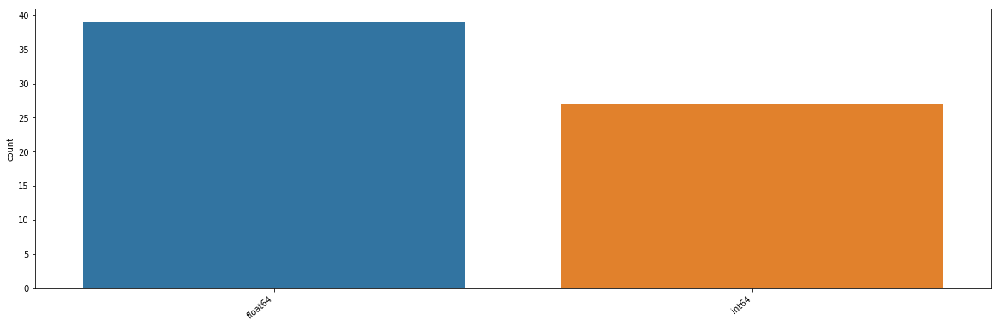

In [44]:
# If there are other re-engineering tasks you need to perform, make sure you
# take care of them here. (Dealing with missing data will come in step 2.1.)

#Verify that we have columns that are all numeric
plt.figure(figsize=(20,6))
ax = sns.countplot(azdias.dtypes)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

In [45]:
print(azdias.dtypes)

ALTERSKATEGORIE_GROB     float64
ANREDE_KZ                  int64
FINANZ_MINIMALIST          int64
FINANZ_SPARER              int64
FINANZ_VORSORGER           int64
FINANZ_ANLEGER             int64
FINANZ_UNAUFFAELLIGER      int64
FINANZ_HAUSBAUER           int64
GREEN_AVANTGARDE           int64
HEALTH_TYP               float64
RETOURTYP_BK_S           float64
SEMIO_SOZ                  int64
SEMIO_FAM                  int64
SEMIO_REL                  int64
SEMIO_MAT                  int64
SEMIO_VERT                 int64
SEMIO_LUST                 int64
SEMIO_ERL                  int64
SEMIO_KULT                 int64
SEMIO_RAT                  int64
SEMIO_KRIT                 int64
SEMIO_DOM                  int64
SEMIO_KAEM                 int64
SEMIO_PFLICHT              int64
SEMIO_TRADV                int64
SOHO_KZ                  float64
VERS_TYP                 float64
ANZ_PERSONEN             float64
ANZ_TITEL                float64
HH_EINKOMMEN_SCORE       float64
          

### Step 1.3: Create a Cleaning Function

Even though you've finished cleaning up the general population demographics data, it's important to look ahead to the future and realize that you'll need to perform the same cleaning steps on the customer demographics data. In this substep, complete the function below to execute the main feature selection, encoding, and re-engineering steps you performed above. Then, when it comes to looking at the customer data in Step 3, you can just run this function on that DataFrame to get the trimmed dataset in a single step.

In [46]:
def clean_data(df):
    """
    Perform feature trimming, re-encoding, and engineering for demographics
    data
    INPUT: Demographics DataFrame
    OUTPUT: Trimmed and cleaned demographics DataFrame
    """
    # Put in code here to execute all main cleaning steps:
    # convert missing value codes into NaNs, ...
    counter = 0
    for x in df.iteritems():
        col_name = feat_info_missing.loc[feat_info_missing['attribute'] == x[0]]
        missing = col_name['missing_or_unknown'][counter]
        counter = counter + 1
        if(len(missing) > 2):
            df[x[0]] = df[x[0]].replace(obtain_missing_info(missing), np.NaN)   
    
    # remove selected columns and rows, ...
    
    df = df.drop('AGER_TYP', axis=1)
    df = df.drop('GEBURTSJAHR', axis=1)
    df = df.drop('TITEL_KZ', axis=1)
    df = df.drop('ALTER_HH', axis=1)
    df = df.drop('KK_KUNDENTYP', axis=1)
    df = df.drop('KBA05_BAUMAX', axis=1)
    
    df = df.dropna(axis=0, inplace=False)
    
    if 'OST_WEST_KZ' in df:
        df['OST_WEST_KZ'] = df['OST_WEST_KZ'].replace({'O': 0, 
                                               'W': 1})
    ones_place = []
    tens_place = []
    
    if 'CAMEO_INTL_2015' in df:
        for x in df['CAMEO_INTL_2015'].iteritems():
            print(x)
            ones_place.append(int(x[1][0]))
            tens_place.append(int(x[1][1]))
        df['CAMEO_INTL_2015_ones'] = ones_place
        df['CAMEO_INTL_2015_tens'] = tens_place
        
    decade_dict = {1: 1, 2: 1, 3: 2, 4: 2, 5: 3, 6: 3, 7:  3,
               8: 4, 9: 4, 10: 5, 11: 5, 12: 5, 13: 5,
               14: 6, 15: 6
              }
    movement_dict = {1: 1, 3: 1, 5: 1, 8: 1, 10: 1, 12: 1, 14: 1,
                2: 2, 4: 2, 6: 2, 7: 2, 9: 2, 11: 2, 13: 2, 15: 2
                }

    if 'PRAEGENDE_JUGENDJAHRE'in df:
        df['DECADE'] = df['PRAEGENDE_JUGENDJAHRE'].map(decade_dict)
        df['MOVEMENT'] = df['PRAEGENDE_JUGENDJAHRE'].map(movement_dict)
    
    columns_to_drop = ['CJT_GESAMTTYP', 'FINANZTYP', 'GFK_URLAUBERTYP', 'LP_FAMILIE_FEIN', 
                       'LP_FAMILIE_GROB', 'LP_STATUS_FEIN', 'LP_STATUS_GROB', 'NATIONALITAET_KZ', 
                       'SHOPPER_TYP', 'TITEL_KZ', 'ZABEOTYP', 'KK_KUNDENTYP', 'GEBAEUDETYP', 
                       'CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'CAMEO_INTL_2015', 'LP_LEBENSPHASE_FEIN', 
                       'LP_LEBENSPHASE_GROB', 'PRAEGENDE_JUGENDJAHRE']
    
    for x in columns_to_drop:
        print(x)
        if x in df.columns:
            df = df.drop(x, axis=1)
    
    # Return the cleaned dataframe.
    return df

## Step 2: Feature Transformation

### Step 2.1: Apply Feature Scaling

Before we apply dimensionality reduction techniques to the data, we need to perform feature scaling so that the principal component vectors are not influenced by the natural differences in scale for features. Starting from this part of the project, you'll want to keep an eye on the [API reference page for sklearn](http://scikit-learn.org/stable/modules/classes.html) to help you navigate to all of the classes and functions that you'll need. In this substep, you'll need to check the following:

- sklearn requires that data not have missing values in order for its estimators to work properly. So, before applying the scaler to your data, make sure that you've cleaned the DataFrame of the remaining missing values before applying your scaler. This can be as simple as just removing all data points with missing data, or applying an [Imputer](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Imputer.html) to replace all missing values. You might also try a more complicated procedure where you temporarily remove missing values in order to compute the scaling parameters before re-introducing those missing values and applying imputation. Think about how much missing data you have and what possible effects each approach might have on your analysis, and justify your decision in the discussion section below.
- For the actual scaling function, a [StandardScaler](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) instance is suggested, scaling each feature to mean 0 and standard deviation 1.
- For these classes, you can make use of the `.fit_transform()` method to both fit a procedure to the data as well as apply the transformation to the data at the same time. Don't forget to keep the fit sklearn objects handy, since you'll be applying them to the customer demographics data towards the end of the project.

In [47]:
# Apply feature scaling to the general population demographics data.
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler(with_mean=True)
scaler.fit_transform(azdias)


array([[-0.77209181,  0.97782476, -1.51222382, ..., -0.5536702 ,
         1.14788172, -1.25110753],
       [ 0.20210748,  0.97782476, -0.7773472 , ..., -0.5536702 ,
        -0.90999737, -0.58413108],
       [ 0.20210748,  0.97782476, -0.7773472 , ..., -0.5536702 ,
         1.14788172, -1.25110753],
       ..., 
       [-0.77209181, -1.02267813, -0.04247059, ..., -0.5536702 ,
         0.46192202,  0.74982182],
       [-1.7462911 , -1.02267813, -1.51222382, ..., -0.5536702 ,
         0.46192202, -1.25110753],
       [ 1.17630677, -1.02267813,  0.69240603, ..., -0.5536702 ,
         0.46192202,  0.08284537]])

In [48]:
azdias.shape

(623209, 66)

### Discussion 2.1: Apply Feature Scaling

For scaling, I decided to go with the StandardScalar approach with filling mean values in for Imputer

### Step 2.2: Perform Dimensionality Reduction

On your scaled data, you are now ready to apply dimensionality reduction techniques.

- Use sklearn's [PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) class to apply principal component analysis on the data, thus finding the vectors of maximal variance in the data. To start, you should not set any parameters (so all components are computed) or set a number of components that is at least half the number of features (so there's enough features to see the general trend in variability).
- Check out the ratio of variance explained by each principal component as well as the cumulative variance explained. Try plotting the cumulative or sequential values using matplotlib's [`plot()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) function. Based on what you find, select a value for the number of transformed features you'll retain for the clustering part of the project.
- Once you've made a choice for the number of components to keep, make sure you re-fit a PCA instance to perform the decided-on transformation.

In [49]:
# Apply PCA to the data.
from sklearn.decomposition import PCA

In [50]:
def scree_plot(pca):
    num_components = len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_
 
    plt.figure(figsize=(18, 6))
    ax = plt.subplot(111)
    cumvals = np.cumsum(vals)
    ax.bar(ind, vals)
    ax.plot(ind, cumvals)
    for i in range(num_components):
        ax.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (ind[i]+0.2, vals[i]), va="bottom", ha="center", fontsize=12)
 
    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=2, length=12)
 
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance Explained (%)")
    plt.title('Explained Variance Per Principal Component')

In [51]:
def do_pca(n_components, data):
    '''
    Transforms data using PCA to create n_components, and provides back the results of the
    transformation.

    INPUT: n_components - int - the number of principal components to create
           data - the data you would like to transform

    OUTPUT: pca - the pca object created after fitting the data
            X_pca - the transformed X matrix with new number of components
    '''
    X = StandardScaler().fit_transform(data)
    pca = PCA(n_components)
    X_pca = pca.fit_transform(X)
    return pca, X_pca


In [52]:
def pca_results(full_dataset, pca):
    '''
    Create a DataFrame of the PCA results
    Includes dimension feature weights and explained variance
    Visualizes the PCA results
    '''
    
    # Dimension indexing
    dimensions = dimensions = ['Dimension {}'.format(i) for i in range(1,len(pca.components_)+1)]

    
    # PCA component
    components = pd.DataFrame(np.round(pca.components_, 4), columns = full_dataset.keys())
    components.index = dimensions
    
    # PCA explained variance
    ratios = pca.explained_variance_ratio_.reshape(len(pca.components_), 1)
    variance_ratios = pd.DataFrame(np.round(ratios, 4), columns = ['Explained Variance'])
    variance_ratios.index = dimensions
    
    # Create a bar plot visualization
    fig, ax = plt.subplots(figsize = (14,8))
    
    # Plot the feature weights as a function of the components
    components.plot(ax = ax, kind = 'bar');
    ax.set_ylabel("Feature Weights")
    ax.set_xticklabels(dimensions, rotation=0)
    
    # Display the explained variance ratios
    for i, ev in enumerate(pca.explained_variance_ratio_):
        ax.text(i-0.40, ax.get_ylim()[1] + 0.05, "Explained Variance\n          %.4f"%(ev))

    # Return a concatenated DataFrame
    return pd.concat([variance_ratios, components], axis = 1)

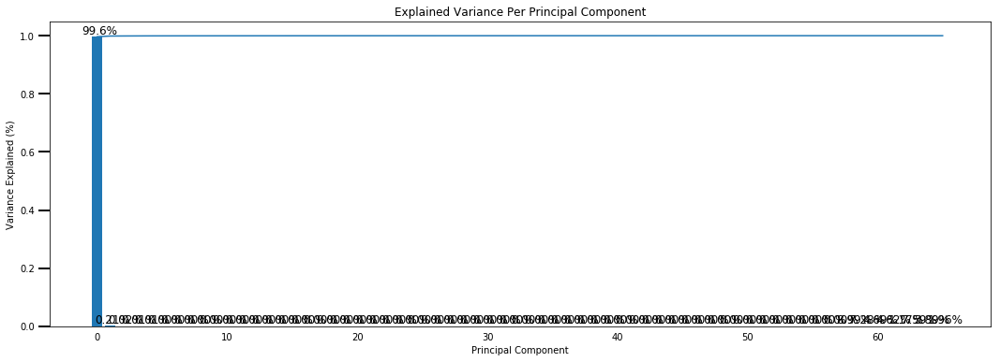

In [53]:
# No parameters
pca = PCA()
pca.fit_transform(azdias)
scree_plot(pca)

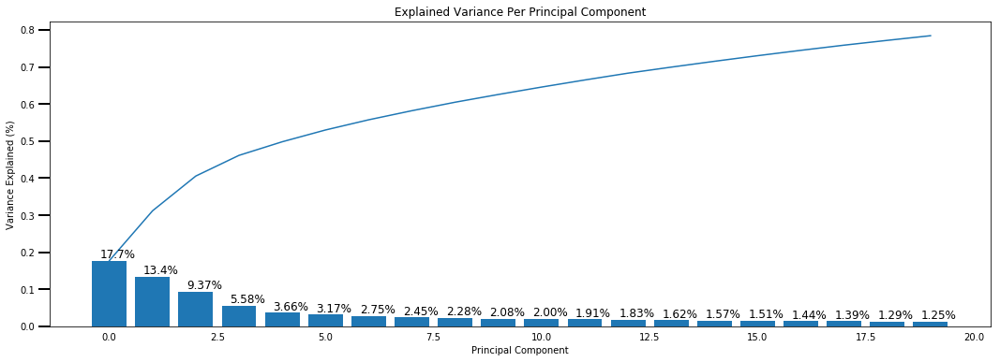

In [54]:
#20 components
pca, X_pca = do_pca(20, azdias)
scree_plot(pca)

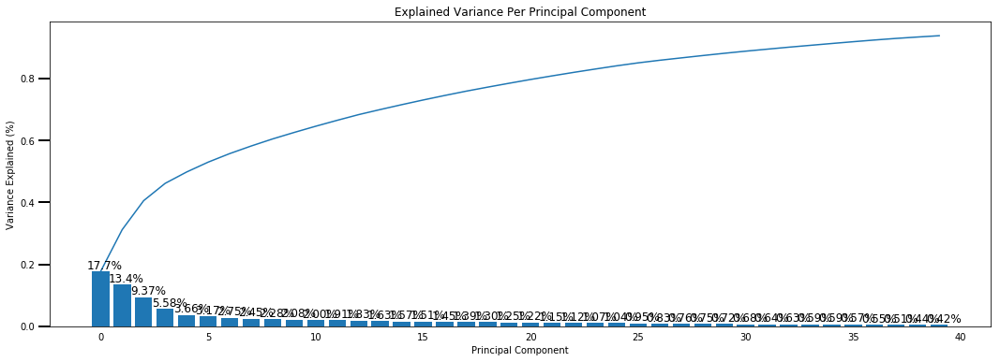

In [55]:
# 40 components
pca, X_pca = do_pca(40, azdias)
scree_plot(pca)

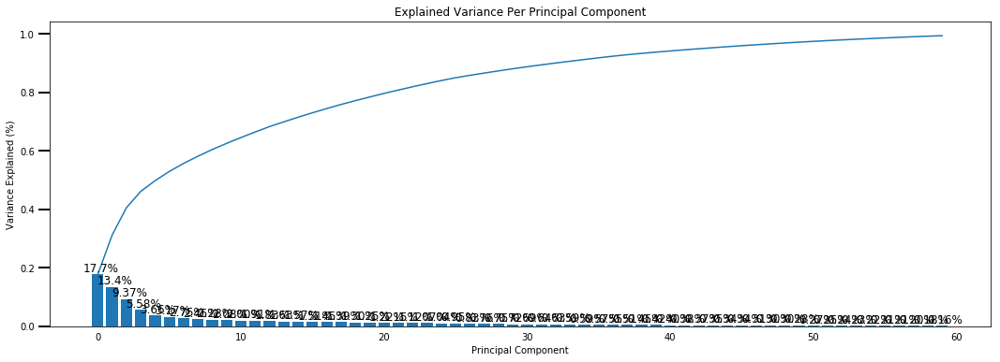

In [56]:
#60 components
pca, X_pca = do_pca(60, azdias)
scree_plot(pca)

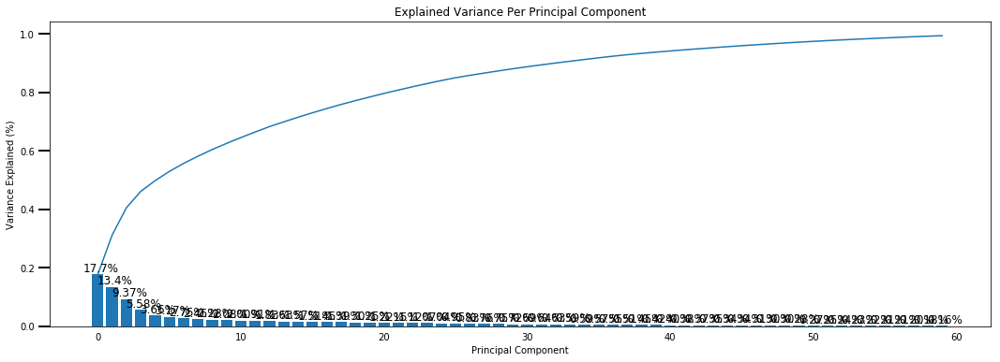

In [57]:
# Re-apply PCA to the data while selecting for number of components to retain.
#60 components
pca, X_pca = do_pca(60, azdias)
scree_plot(pca)


### Discussion 2.2: Perform Dimensionality Reduction

As we can see when the number of components is low (i.e. 20-40), we are still seeing a good deal of slop in the amount of variablility explained.  As we get to the 65 number of components, we start to see it level off.  I decided to go with 60 components as it still had a slight slope.

### Step 2.3: Interpret Principal Components

Now that we have our transformed principal components, it's a nice idea to check out the weight of each variable on the first few components to see if they can be interpreted in some fashion.

As a reminder, each principal component is a unit vector that points in the direction of highest variance (after accounting for the variance captured by earlier principal components). The further a weight is from zero, the more the principal component is in the direction of the corresponding feature. If two features have large weights of the same sign (both positive or both negative), then increases in one tend expect to be associated with increases in the other. To contrast, features with different signs can be expected to show a negative correlation: increases in one variable should result in a decrease in the other.

- To investigate the features, you should map each weight to their corresponding feature name, then sort the features according to weight. The most interesting features for each principal component, then, will be those at the beginning and end of the sorted list. Use the data dictionary document to help you understand these most prominent features, their relationships, and what a positive or negative value on the principal component might indicate.
- You should investigate and interpret feature associations from the first three principal components in this substep. To help facilitate this, you should write a function that you can call at any time to print the sorted list of feature weights, for the *i*-th principal component. This might come in handy in the next step of the project, when you interpret the tendencies of the discovered clusters.

In [58]:
pd.set_option('display.max_columns', None)

,Explained Variance,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,DECADE,MOVEMENT,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens
Dimension 1,0.1772,-0.1232,-0.0006,-0.2089,0.1421,-0.1148,0.0655,0.0742,0.1484,-0.1083,0.0334,-0.0237,0.0466,0.0807,0.1083,0.0836,-0.0258,-0.0881,-0.0863,0.0754,0.0919,-0.0008,0.0166,0.0320,0.1112,0.0987,-0.0022,0.0205,-0.0784,-0.0045,0.1898,0.0321,-0.0623,0.1317,0.0329,-0.1608,-0.0355,-0.0623,-0.0788,-0.2184,0.0053,0.1308,0.1488,-0.2096,-0.1219,0.1886,-0.1602,-0.1143,0.0415,-0.2341,-0.0344,0.0698,-0.0819,-0.2217,0.1451,0.2202,0.2151,0.2119,0.0366,-0.1689,0.1408,0.1922,0.1283,0.1034,-0.1083,0.1967,-0.1231
Dimension 2,0.1345,0.2586,0.0856,0.0670,-0.2338,0.2265,-0.2042,-0.2246,0.1119,-0.0128,-0.0525,0.1643,-0.1005,-0.1776,-0.2618,-0.1544,-0.0641,0.1794,0.2307,-0.2172,-0.1726,0.1183,0.0665,0.1081,-0.2375,-0.2291,-0.0022,0.0279,-0.0599,0.0079,0.0429,0.1159,0.0598,0.0583,0.0296,-0.0676,-0.0273,-0.0305,-0.0572,-0.0797,-0.0097,0.0462,0.0663,-0.0870,-0.0624,0.0942,-0.0775,-0.0422,0.0025,-0.0879,-0.1571,0.0208,-0.0383,-0.0943,0.0636,0.0964,0.0926,0.0876,0.0119,-0.0760,0.0690,0.0943,0.0650,-0.2482,-0.0128,0.0690,-0.0028
Dimension 3,0.0937,0.0803,-0.3683,0.1617,-0.1006,0.0964,-0.1872,-0.0896,-0.0547,0.0584,-0.0106,0.1131,0.2639,0.2519,0.0782,0.0494,0.3493,0.0723,-0.1717,0.2328,-0.2175,-0.2707,-0.3123,-0.3386,-0.0753,-0.0838,0.0006,0.0198,-0.0012,0.0109,-0.0351,0.0905,0.0355,0.0217,0.0134,-0.0355,-0.0091,-0.0101,-0.0241,-0.0149,-0.0127,0.0017,0.0239,-0.0198,-0.0347,0.0454,-0.0416,-0.0287,-0.0207,-0.0219,-0.0498,-0.0095,-0.0195,-0.0400,0.0264,0.0401,0.0412,0.0430,0.0062,-0.0330,0.0288,0.0454,0.0277,-0.1050,0.0584,0.0167,-0.0054
Dimension 4,0.0558,-0.0455,0.0432,0.0610,0.0022,-0.0220,-0.1167,0.0923,-0.1080,0.3792,0.0051,-0.0043,-0.0047,-0.0227,-0.0024,0.0208,-0.0151,-0.0051,-0.0191,-0.0337,0.0573,0.0169,0.1223,0.0817,0.0234,0.0671,0.0017,0.0163,0.0946,0.0466,-0.2648,-0.0844,0.0058,-0.0390,0.0325,-0.1263,-0.0466,0.1076,-0.2807,0.0997,0.0042,-0.0734,-0.0372,0.0570,-0.2187,0.2487,-0.2005,-0.0675,-0.2578,0.0671,0.1367,-0.1967,0.0359,-0.0310,0.0925,0.0813,0.0634,0.0484,0.1162,0.0336,0.0536,0.2429,0.0912,0.0442,0.3792,-0.1394,0.0707
Dimension 5,0.0367,0.0040,0.0079,0.0863,0.0000,-0.0628,0.0560,-0.0453,-0.0884,0.0525,0.0069,-0.0352,0.0031,-0.0358,-0.0083,-0.0665,0.0021,-0.0119,0.0247,0.0115,-0.0112,-0.0248,0.0062,0.0265,-0.0032,-0.0291,0.0036,0.0013,0.1391,-0.0017,-0.0631,-0.1284,0.0427,-0.0206,-0.0228,0.1253,0.0970,-0.2154,0.0038,0.0984,-0.1353,-0.0841,0.0061,0.0933,-0.0246,0.0209,-0.0625,0.0485,0.1325,0.1032,0.1166,0.0823,-0.5114,-0.0229,-0.1183,-0.0352,0.0200,0.0930,-0.4935,-0.3993,0.1883,0.0701,0.1189,0.0334,0.0525,-0.0132,0.0272
Dimension 6,0.0318,-0.0014,0.0261,-0.0239,0.0025,-0.0319,0.0186,-0.0334,0.0403,0.0332,-0.0415,-0.0227,0.0115,-0.0022,-0.0084,0.0164,-0.0083,0.0300,0.0000,-0.0426,0.0234,-0.0188,-0.0150,-0.0185,-0.0276,0.0330,0.0009,-0.0558,0.0361,0.0735,-0.0817,-0.0365,0.0106,0.3568,0.2480,-0.0272,0.0215,-0.1315,0.1510,-0.0156,-0.3659,-0.2042,0.4034,-0.1343,0.0070,-0.1024,0.0324,-0.2202,-0.2222,-0.0871,0.0346,-0.2292,0.0291,0.0107,-0.2518,-0.0723,0.1113,0.1063,0.0103,-0.0728,-0.2010,-0.0951,-0.2311,0.0047,0.0332,-0.0727,0.0366
Dimension 7,0.0275,0.0186,-0.0600,0.0455,0.0637,-0.0134,0.0733,0.0493,-0.1902,-0

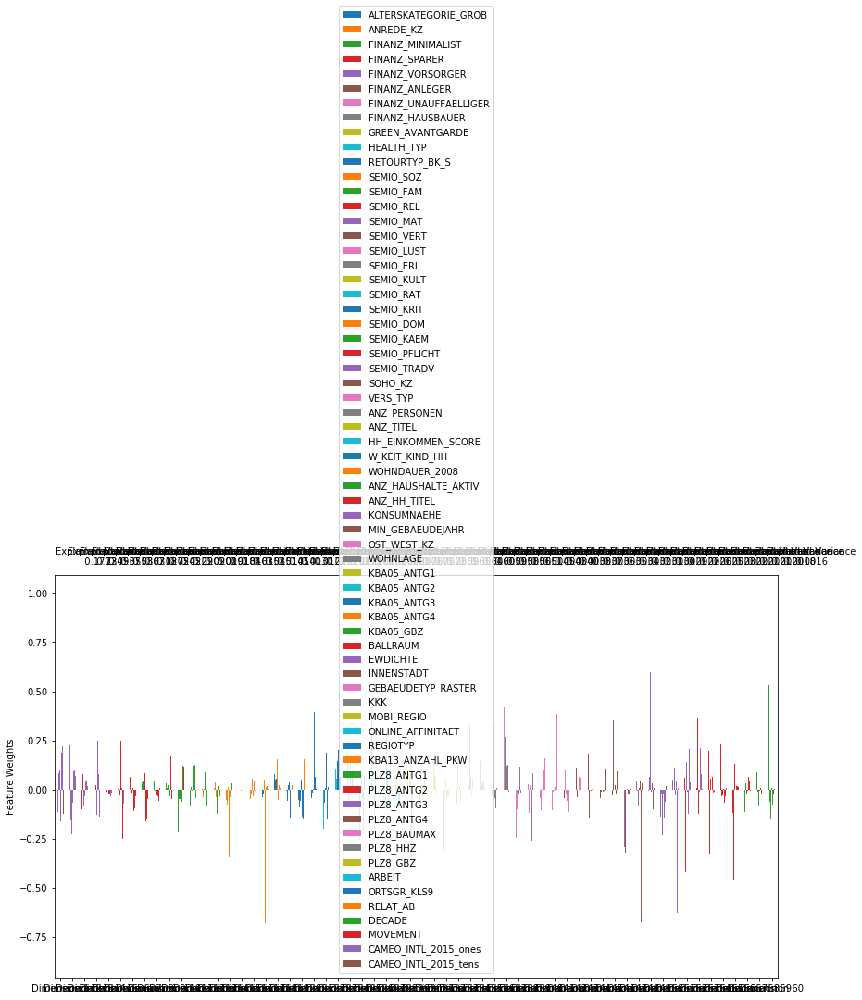

In [59]:
pca_results(azdias, pca)

### Discussion 2.3: Interpret Principal Components


Principal Component 1:
- The strongest positive feature weights: ...KBA13_ANZAHL_PKW (Number of cars in the PLZ8 region) Value of 1.0000
- The strongest negative feature weights: ...ANZ_HAUSHALTE_AKTIV (Number of households in the building) -0.0042
What this is showing us is that when the number of cars in the PLZ8 region is increasing, the number of households in the building are decreasing.  This could mean something similar to if someone has more cars(due to wealthiness), they might be living in a single home compared to that of an apartment or multi-family home

Principal Component 2:
- The strongest positive feature weights: ...ANZ_HAUSHALTE_AKTIV (Number of households in the building) 0.9904
- The strongest negative feature weights: ...MOBI_REGIO (movement patterns) -0.0446

This is showing that there is a correlation between the number of households in the building and the amount of movement that a person does.  A possibility could be that someone that lives in a building with multiple households tend to move alot more than that of someone that lives in a single family home.

Principal Component 3:
- The strongest positive feature weights: ...SEMIO_ERL (Personality typology) 0.2936
- The strongest negative feature weights: ...SEMIO_REL (Personality typology) -0.3271

There is a correlation between someone that is reglious and that of someone that is event-minded.  

## Step 3: Clustering

### Step 3.1: Apply Clustering to General Population

You've assessed and cleaned the demographics data, then scaled and transformed them. Now, it's time to see how the data clusters in the principal components space. In this substep, you will apply k-means clustering to the dataset and use the average within-cluster distances from each point to their assigned cluster's centroid to decide on a number of clusters to keep.

- Use sklearn's [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) class to perform k-means clustering on the PCA-transformed data.
- Then, compute the average difference from each point to its assigned cluster's center. **Hint**: The KMeans object's `.score()` method might be useful here, but note that in sklearn, scores tend to be defined so that larger is better. Try applying it to a small, toy dataset, or use an internet search to help your understanding.
- Perform the above two steps for a number of different cluster counts. You can then see how the average distance decreases with an increasing number of clusters. However, each additional cluster provides a smaller net benefit. Use this fact to select a final number of clusters in which to group the data. **Warning**: because of the large size of the dataset, it can take a long time for the algorithm to resolve. The more clusters to fit, the longer the algorithm will take. You should test for cluster counts through at least 10 clusters to get the full picture, but you shouldn't need to test for a number of clusters above about 30.
- Once you've selected a final number of clusters to use, re-fit a KMeans instance to perform the clustering operation. Make sure that you also obtain the cluster assignments for the general demographics data, since you'll be using them in the final Step 3.3.

In [60]:
# Over a number of different cluster counts...
    # run k-means clustering on the data and...    
    # compute the average within-cluster distances.
from sklearn.cluster import KMeans    

In [61]:
'''For each k value, we will initialise k-means and use the inertia attribute to 
identify the sum of squared distances of samples to the nearest cluster centre.'''
Sum_of_squared_distances = []
K = range(10,25)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(azdias)
    Sum_of_squared_distances.append(km.inertia_)

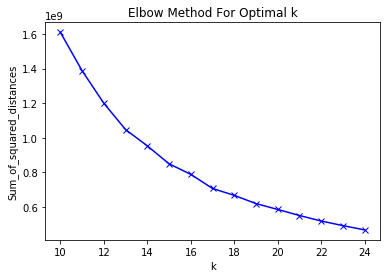

In [62]:
# Investigate the change in within-cluster distance across number of clusters.
# HINT: Use matplotlib's plot function to visualize this relationship.

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [63]:
# Re-fit the k-means model with the selected number of clusters and obtain
# cluster predictions for the general population demographics data.
km = KMeans(n_clusters=17)
#model_general = km.fit(azdias)
model_general = km.fit(X_pca)


In [64]:
predict_general = model_general.predict(X_pca)

### Discussion 3.1: Apply Clustering to General Population

It appears to me that the elbow is roughly between 16-18K.  I decided to go with a K of 17 as that seemed like the biggest bend between 16-18.

### Step 3.2: Apply All Steps to the Customer Data

Now that you have clusters and cluster centers for the general population, it's time to see how the customer data maps on to those clusters. Take care to not confuse this for re-fitting all of the models to the customer data. Instead, you're going to use the fits from the general population to clean, transform, and cluster the customer data. In the last step of the project, you will interpret how the general population fits apply to the customer data.

- Don't forget when loading in the customers data, that it is semicolon (`;`) delimited.
- Apply the same feature wrangling, selection, and engineering steps to the customer demographics using the `clean_data()` function you created earlier. (You can assume that the customer demographics data has similar meaning behind missing data patterns as the general demographics data.)
- Use the sklearn objects from the general demographics data, and apply their transformations to the customers data. That is, you should not be using a `.fit()` or `.fit_transform()` method to re-fit the old objects, nor should you be creating new sklearn objects! Carry the data through the feature scaling, PCA, and clustering steps, obtaining cluster assignments for all of the data in the customer demographics data.

In [65]:
# Load in the customer demographics data.
customers = pd.read_csv("Udacity_CUSTOMERS_Subset.csv", sep=';')

In [66]:
# Apply preprocessing, feature transformation, and clustering from the general
# demographics onto the customer data, obtaining cluster predictions for the
# customer demographics data.

customers = clean_data(customers)

(0, '13')
(2, '34')
(4, '41')
(5, '34')
(6, '23')
(7, '15')
(9, '15')
(11, '14')
(12, '22')
(14, '51')
(15, '15')
(16, '15')
(17, '14')
(18, '41')
(19, '24')
(21, '43')
(22, '24')
(23, '51')
(24, '33')
(25, '22')
(26, '25')
(27, '44')
(28, '54')
(29, '51')
(30, '32')
(31, '24')
(32, '51')
(33, '25')
(35, '14')
(41, '24')
(42, '43')
(45, '34')
(47, '43')
(49, '15')
(50, '15')
(52, '35')
(57, '24')
(61, '32')
(63, '25')
(64, '12')
(66, '15')
(73, '54')
(74, '14')
(75, '25')
(76, '24')
(77, '12')
(78, '31')
(79, '24')
(80, '13')
(81, '25')
(82, '34')
(83, '35')
(86, '25')
(88, '41')
(93, '54')
(95, '24')
(97, '45')
(98, '41')
(99, '35')
(103, '24')
(107, '14')
(108, '22')
(109, '54')
(113, '34')
(134, '45')
(141, '41')
(144, '25')
(145, '43')
(146, '43')
(155, '25')
(158, '15')
(159, '34')
(160, '33')
(164, '41')
(169, '41')
(173, '22')
(174, '51')
(175, '15')
(176, '41')
(182, '22')
(183, '51')
(186, '25')
(187, '12')
(189, '14')
(191, '43')
(193, '31')
(194, '41')
(208, '24')
(209, '25'

In [67]:
customers.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens,DECADE,MOVEMENT
0,4.0,1,5,1,5,1,2,2,1,1.0,5.0,6,5,2,6,6,7,3,4,1,3,1,1,2,1,0.0,1.0,2.0,0.0,1.0,6.0,9.0,1.0,0.0,5.0,1992.0,1,7.0,2.0,2.0,0.0,0.0,4.0,3.0,2.0,4.0,4.0,1.0,4.0,3.0,1.0,1201.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,1.0,2.0,1.0,1,3,2,2
2,4.0,2,5,1,5,1,4,4,1,2.0,5.0,2,2,1,3,3,7,7,1,2,7,5,6,4,1,0.0,2.0,1.0,0.0,1.0,6.0,9.0,1.0,0.0,1.0,1992.0,1,2.0,2.0,2.0,0.0,0.0,3.0,7.0,4.0,1.0,3.0,3.0,3.0,1.0,7.0,433.0,2.0,3.0,3.0,1.0,3.0,3.0,2.0,3.0,5.0,3.0,3,4,2,2
4,3.0,1,3,1,4,4,5,2,0,3.0,5.0,4,5,4,6,5,6,4,5,5,3,5,2,5,4,0.0,2.0,4.0,0.0,6.0,2.0,9.0,7.0,0.0,1.0,1992.0,1,3.0,0.0,3.0,2.0,0.0,3.0,3.0,4.0,4.0,3.0,4.0,3.0,5.0,7.0,513.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,5.0,1.0,4,1,4,1
5,3.0,1,5,1,5,1,2,3,1,3.0,3.0,6,4,4,1,7,6,4,6,2,5,5,3,3,4,0.0,2.0,2.0,0.0,1.0,6.0,9.0,1.0,0.0,2.0,1992.0,1,1.0,2.0,2.0,1.0,0.0,3.0,7.0,5.0,8.0,4.0,2.0,3.0,3.0,3.0,1167.0,2.0,3.0,2.0,1.0,1.0,5.0,5.0,3.0,7.0,5.0,3,4,2,2
6,4.0,1,5,1,5,1,1,2,1,2.0,5.0,4,2,5,1,6,5,3,4,3,3,1,2,2,4,0.0,1.0,2.0,0.0,2.0,6.0,9.0,1.0,0.0,4.0,1992.0,1,7.0,4.0,1.0,0.0,0.0,4.0,6.0,2.0,5.0,4.0,2.0,4.0,4.0,3.0,1300.0,3.0,2.0,1.0,0.0,1.0,5.0,5.0,2.0,3.0,2.0,2,3,2,2


In [68]:
#normalization using StandardScaler
customers[customers.columns] = scaler.transform(customers[customers.columns].as_matrix())
#transform the customers data using pca object
customers_pca = pca.transform(customers)
#predict clustering using the kmeans object
predict_customers = km.predict(customers_pca)

### Step 3.3: Compare Customer Data to Demographics Data

At this point, you have clustered data based on demographics of the general population of Germany, and seen how the customer data for a mail-order sales company maps onto those demographic clusters. In this final substep, you will compare the two cluster distributions to see where the strongest customer base for the company is.

Consider the proportion of persons in each cluster for the general population, and the proportions for the customers. If we think the company's customer base to be universal, then the cluster assignment proportions should be fairly similar between the two. If there are only particular segments of the population that are interested in the company's products, then we should see a mismatch from one to the other. If there is a higher proportion of persons in a cluster for the customer data compared to the general population (e.g. 5% of persons are assigned to a cluster for the general population, but 15% of the customer data is closest to that cluster's centroid) then that suggests the people in that cluster to be a target audience for the company. On the other hand, the proportion of the data in a cluster being larger in the general population than the customer data (e.g. only 2% of customers closest to a population centroid that captures 6% of the data) suggests that group of persons to be outside of the target demographics.

Take a look at the following points in this step:

- Compute the proportion of data points in each cluster for the general population and the customer data. Visualizations will be useful here: both for the individual dataset proportions, but also to visualize the ratios in cluster representation between groups. Seaborn's [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html) or [`barplot()`](https://seaborn.pydata.org/generated/seaborn.barplot.html) function could be handy.
  - Recall the analysis you performed in step 1.1.3 of the project, where you separated out certain data points from the dataset if they had more than a specified threshold of missing values. If you found that this group was qualitatively different from the main bulk of the data, you should treat this as an additional data cluster in this analysis. Make sure that you account for the number of data points in this subset, for both the general population and customer datasets, when making your computations!
- Which cluster or clusters are overrepresented in the customer dataset compared to the general population? Select at least one such cluster and infer what kind of people might be represented by that cluster. Use the principal component interpretations from step 2.3 or look at additional components to help you make this inference. Alternatively, you can use the `.inverse_transform()` method of the PCA and StandardScaler objects to transform centroids back to the original data space and interpret the retrieved values directly.
- Perform a similar investigation for the underrepresented clusters. Which cluster or clusters are underrepresented in the customer dataset compared to the general population, and what kinds of people are typified by these clusters?

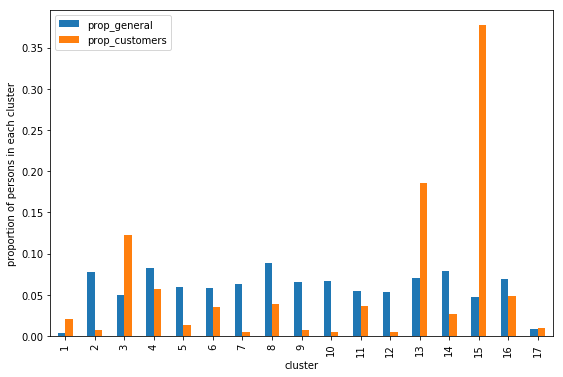

In [69]:
# Compare the proportion of data in each cluster for the customer data to the
# proportion of data in each cluster for the general population.

general_prop = []
customers_prop = []
x = [i+1 for i in range(17)]
for i in range(17):
    general_prop.append((predict_general == i).sum()/len(predict_general))
    customers_prop.append((predict_customers == i).sum()/len(predict_customers))


df_general = pd.DataFrame({'cluster' : x, 'prop_general' : general_prop, 'prop_customers':customers_prop})

df_general.plot(x='cluster', y = ['prop_general', 'prop_customers'], kind='bar', figsize=(9,6))
plt.ylabel('proportion of persons in each cluster')
plt.show()

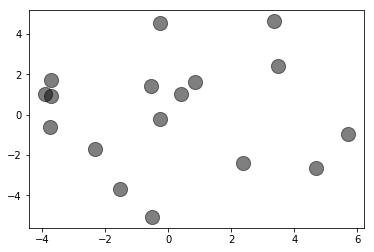

In [97]:
centers = km.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

In [100]:
data = scaler.inverse_transform(pca.inverse_transform(customers_pca[np.where(predict_customers==7)])).round()
df = pd.DataFrame(data=data,
          index=np.array(range(0, data.shape[0])),
          columns=group_1.columns)
df.head(10)

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens,DECADE,MOVEMENT
0,3.0,1.0,4.0,2.0,4.0,4.0,5.0,2.0,-0.0,3.0,5.0,4.0,5.0,4.0,6.0,5.0,6.0,4.0,6.0,5.0,3.0,5.0,3.0,5.0,4.0,0.0,2.0,4.0,0.0,6.0,2.0,9.0,7.0,-0.0,1.0,1992.0,1.0,3.0,-0.0,3.0,2.0,-0.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,5.0,7.0,496.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,5.0,1.0,4.0,1.0,4.0,1.0
1,4.0,1.0,3.0,2.0,5.0,2.0,1.0,4.0,1.0,2.0,5.0,6.0,4.0,2.0,4.0,6.0,5.0,4.0,6.0,3.0,3.0,3.0,2.0,3.0,4.0,-0.0,1.0,1.0,0.0,5.0,6.0,5.0,29.0,0.0,2.0,1992.0,1.0,7.0,3.0,1.0,-0.0,-0.0,5.0,3.0,3.0,6.0,3.0,3.0,3.0,1.0,6.0,623.0,1.0,4.0,3.0,1.0,3.0,4.0,3.0,1.0,3.0,1.0,4.0,2.0,3.0,1.0
2,4.0,1.0,3.0,3.0,4.0,2.0,3.0,2.0,-0.0,2.0,4.0,4.0,5.0,3.0,4.0,6.0,5.0,7.0,5.0,3.0,3.0,3.0,3.0,2.0,1.0,0.0,1.0,2.0,0.0,4.0,3.0,9.0,7.0,-0.0,2.0,1992.0,1.0,2.0,0.0,0.0,3.0,0.0,2.0,2.0,4.0,3.0,4.0,2.0,3.0,4.0,4.0,1169.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,4.0,8.0,3.0,4.0,1.0,4.0,1.0
3,4.0,1.0,4.0,1.0,5.0,1.0,2.0,5.0,-0.0,2.0,5.0,3.0,6.0,3.0,6.0,6.0,7.0,6.0,5.0,3.0,3.0,3.0,3.0,2.0,2.0,0.0,1.0,2.0,-0.0,5.0,6.0,9.0,9.0,-0.0,1.0,1992.0,1.0,3.0,-0.0,4.0,1.0,-0.0,3.0,6.0,5.0,8.0,3.0,4.0,2.0,0.0,7.0,369.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,7.0,4.0,4.0,1.0,3.0,1.0
4,4.0,1.0,4.0,1.0,5.0,1.0,2.0,5.0,0.0,2.0,5.0,6.0,6.0,3.0,4.0,7.0,7.0,3.0,4.0,1.0,3.0,3.0,2.0,2.0,2.0,-0.0,1.0,5.0,-0.0,6.0,2.0,9.0,6.0,-0.0,1.0,1992.0,1.0,2.0,-0.0,3.0,2.0,-0.0,2.0,6.0,6.0,1.0,3.0,4.0,2.0,1.0,6.0,325.0,1.0,4.0,3.0,1.0,3.0,4.0,3.0,3.0,7.0,2.0,5.0,1.0,2.0,1.0
5,4.0,1.0,5.0,1.0,5.0,1.0,2.0,3.0,1.0,3.0,5.0,3.0,5.0,2.0,1.0,7.0,7.0,3.0,5.0,1.0,1.0,3.0,3.0,4.0,4.0,-0.0,2.0,6.0,-0.0,4.0,2.0,9.0,2.0,0.0,2.0,1992.0,1.0,2.0,2.0,3.0,0.0,0.0,3.0,5.0,6.0,2.0,5.0,3.0,3.0,4.0,6.0,486.0,1.0,4.0,3.0,1.0,3.0,4.0,3.0,3.0,7.0,2.0,4.0,2.0,2.0,2.0
6,4.0,1.0,4.0,1.0,5.0,1.0,1.0,5.0,0.0,2.0,3.0,6.0,5.0,5.0,4.0,6.0,5.0,3.0,4.0,3.0,3.0,3.0,2.0,2.0,4.0,0.0,1.0,3.0,0.0,5.0,4.0,9.0,11.0,-0.0,4.0,1992.0,1.0,7.0,0.0,0.0,3.0,0.0,2.0,2.0,4.0,4.0,3.0,2.0,2.0,4.0,3.0,1797.0,2.0,3.0,2.0,1.0,1.0,5.0,5.0,2.0,3.0,3.0,4.0,1.0,4.0,1.0
7,3.0,1.0,3.0,1.0,5.0,1.0,1.0,5.0,0.0,1.0,3.0,6.0,5.0,5.0,6.0,6.0,7.0,3.0,6.0,3.0,3.0,3.0,1.0,3.0,4.0,-0.0,2.0,1.0,0.0,6.0,6.0,6.0,8.0,0.0,3.0,1992.0,1.0,1.0,1.0,0.0,2.0,0.0,3.0,7.0,3.0,8.0,4.0,1.0,2.0,1.0,1.0,662.0,2.0,3.0,2.0,1.0,1.0,4.0,3.0,3.0,5.0,3.0,4.0,1.0,1.0,1.0
8,3.0,1.0,4.0,1.0,5.0,1.0,2.0,4.0,0.0,3.0,5.0,6.0,4.0,4.0,2.0,7.0,4.0,4.0,5.0,2.0,5.0,5.0,3.0,4.0,2.0,0.0,2.0,1.0,0.0,5.0,6.0,9.0,5.0,0.0,2.0,1992.0,1.0,3.0,2.0,0.0,1.0,0.0,3.0,1.0,5.0,4.0,3.0,3.0,3.0,2.0,5.0,1091.0,1.0,4.0,3.0,1.0,3.0,5.0,3.0,3.0,8.0,5.0,4.0,1.0,2.0,1.0
9,3.0,1.0,3.0,1.0,5.0,1.0,2.0,4.0,-0.0,1.0,3.0,6.0,5.0,5.0,4.0,7.0,7.0,3.0,6.0,3.0,3.0,3.0,2.0,4.0,1.0,-0.0,1.0,1.0,-0.0,6.0,5.0,9.0,4.0,0.0,1.0,1992.0,1.0,7.0,-0.0,3.0,1.0,1.0,2.0,2.0,3.0,5.0,4.0,2.0,2.0,1.0,3.0,684.0,2.0,3.0,1.0,0.0,1.0,4.0,4.0,2.0,4.0,2.0,4.0,1.0,4.0,1.0


In [105]:
def plot_scaled_comparison(new_pca, predict, num):
    data = scaler.inverse_transform(pca.inverse_transform(new_pca[np.where(predict==num)])).round()
    df = pd.DataFrame(data=data,
                      index=np.array(range(0, data.shape[0])),
                      columns=group_1.columns)
    return df

In [106]:
# What kinds of people are part of a cluster that is overrepresented in the
# customer data compared to the general population?
df = plot_scaled_comparison(customers_pca, predict_customers, 7)
df.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens,DECADE,MOVEMENT
0,3.0,1.0,4.0,2.0,4.0,4.0,5.0,2.0,-0.0,3.0,5.0,4.0,5.0,4.0,6.0,5.0,6.0,4.0,6.0,5.0,3.0,5.0,3.0,5.0,4.0,0.0,2.0,4.0,0.0,6.0,2.0,9.0,7.0,-0.0,1.0,1992.0,1.0,3.0,-0.0,3.0,2.0,-0.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,5.0,7.0,496.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,5.0,1.0,4.0,1.0,4.0,1.0
1,4.0,1.0,3.0,2.0,5.0,2.0,1.0,4.0,1.0,2.0,5.0,6.0,4.0,2.0,4.0,6.0,5.0,4.0,6.0,3.0,3.0,3.0,2.0,3.0,4.0,-0.0,1.0,1.0,0.0,5.0,6.0,5.0,29.0,0.0,2.0,1992.0,1.0,7.0,3.0,1.0,-0.0,-0.0,5.0,3.0,3.0,6.0,3.0,3.0,3.0,1.0,6.0,623.0,1.0,4.0,3.0,1.0,3.0,4.0,3.0,1.0,3.0,1.0,4.0,2.0,3.0,1.0
2,4.0,1.0,3.0,3.0,4.0,2.0,3.0,2.0,-0.0,2.0,4.0,4.0,5.0,3.0,4.0,6.0,5.0,7.0,5.0,3.0,3.0,3.0,3.0,2.0,1.0,0.0,1.0,2.0,0.0,4.0,3.0,9.0,7.0,-0.0,2.0,1992.0,1.0,2.0,0.0,0.0,3.0,0.0,2.0,2.0,4.0,3.0,4.0,2.0,3.0,4.0,4.0,1169.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,4.0,8.0,3.0,4.0,1.0,4.0,1.0
3,4.0,1.0,4.0,1.0,5.0,1.0,2.0,5.0,-0.0,2.0,5.0,3.0,6.0,3.0,6.0,6.0,7.0,6.0,5.0,3.0,3.0,3.0,3.0,2.0,2.0,0.0,1.0,2.0,-0.0,5.0,6.0,9.0,9.0,-0.0,1.0,1992.0,1.0,3.0,-0.0,4.0,1.0,-0.0,3.0,6.0,5.0,8.0,3.0,4.0,2.0,0.0,7.0,369.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,3.0,7.0,4.0,4.0,1.0,3.0,1.0
4,4.0,1.0,4.0,1.0,5.0,1.0,2.0,5.0,0.0,2.0,5.0,6.0,6.0,3.0,4.0,7.0,7.0,3.0,4.0,1.0,3.0,3.0,2.0,2.0,2.0,-0.0,1.0,5.0,-0.0,6.0,2.0,9.0,6.0,-0.0,1.0,1992.0,1.0,2.0,-0.0,3.0,2.0,-0.0,2.0,6.0,6.0,1.0,3.0,4.0,2.0,1.0,6.0,325.0,1.0,4.0,3.0,1.0,3.0,4.0,3.0,3.0,7.0,2.0,5.0,1.0,2.0,1.0


In [111]:
df = plot_scaled_comparison(X_pca, predict_general, 7)
df.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens,DECADE,MOVEMENT
0,4.0,1.0,3.0,1.0,5.0,1.0,1.0,5.0,-0.0,2.0,3.0,4.0,6.0,3.0,4.0,6.0,5.0,7.0,5.0,3.0,3.0,3.0,3.0,2.0,1.0,0.0,1.0,2.0,-0.0,5.0,3.0,9.0,19.0,-0.0,5.0,1993.0,0.0,3.0,-1.0,1.0,2.0,0.0,2.0,1.0,6.0,4.0,3.0,2.0,2.0,4.0,4.0,727.0,2.0,2.0,2.0,1.0,1.0,5.0,5.0,4.0,9.0,3.0,3.0,1.0,4.0,1.0
1,3.0,1.0,3.0,3.0,4.0,1.0,1.0,2.0,-0.0,3.0,2.0,3.0,4.0,4.0,4.0,5.0,4.0,4.0,5.0,2.0,3.0,5.0,4.0,4.0,2.0,0.0,2.0,3.0,0.0,5.0,2.0,7.0,13.0,-0.0,1.0,1994.0,1.0,2.0,1.0,2.0,1.0,0.0,3.0,2.0,5.0,4.0,4.0,3.0,3.0,5.0,6.0,893.0,3.0,3.0,0.0,1.0,1.0,4.0,5.0,3.0,5.0,1.0,5.0,1.0,1.0,4.0
2,4.0,1.0,3.0,2.0,5.0,1.0,1.0,4.0,-0.0,2.0,3.0,6.0,6.0,2.0,4.0,6.0,5.0,3.0,4.0,3.0,3.0,3.0,3.0,1.0,4.0,-0.0,1.0,2.0,-0.0,6.0,6.0,9.0,15.0,-0.0,2.0,1992.0,1.0,3.0,1.0,-0.0,3.0,-0.0,2.0,2.0,6.0,3.0,4.0,3.0,2.0,4.0,6.0,701.0,2.0,4.0,2.0,0.0,2.0,4.0,3.0,4.0,8.0,4.0,3.0,1.0,4.0,5.0
3,5.0,1.0,4.0,1.0,5.0,1.0,1.0,3.0,0.0,2.0,5.0,4.0,2.0,3.0,6.0,6.0,7.0,7.0,6.0,1.0,3.0,3.0,3.0,1.0,2.0,-0.0,2.0,1.0,-0.0,5.0,6.0,9.0,3.0,0.0,3.0,1992.0,1.0,3.0,2.0,1.0,-0.0,-0.0,5.0,2.0,5.0,5.0,4.0,4.0,4.0,1.0,7.0,387.0,1.0,4.0,3.0,2.0,4.0,3.0,2.0,3.0,5.0,5.0,3.0,1.0,4.0,1.0
4,2.0,1.0,3.0,2.0,4.0,2.0,3.0,2.0,0.0,3.0,3.0,7.0,7.0,6.0,7.0,7.0,3.0,3.0,7.0,5.0,2.0,4.0,4.0,6.0,5.0,-0.0,2.0,2.0,0.0,6.0,3.0,4.0,6.0,0.0,5.0,1992.0,1.0,3.0,0.0,4.0,1.0,0.0,3.0,6.0,5.0,4.0,5.0,3.0,2.0,4.0,5.0,1000.0,2.0,3.0,2.0,1.0,1.0,5.0,4.0,4.0,7.0,5.0,5.0,1.0,3.0,5.0


It seems that this cluster belongs to older people that are mainly male

In [113]:
# What kinds of people are part of a cluster that is underrepresented in the
# customer data compared to the general population?
df = plot_scaled_comparison(customers_pca, predict_customers, 12)
df.head()


,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens,DECADE,MOVEMENT
0,4.0,2.0,5.0,0.0,5.0,1.0,4.0,4.0,2.0,2.0,5.0,2.0,2.0,1.0,3.0,3.0,7.0,7.0,1.0,2.0,7.0,5.0,6.0,4.0,1.0,-0.0,2.0,1.0,-0.0,1.0,6.0,9.0,1.0,-0.0,1.0,1992.0,1.0,2.0,2.0,2.0,0.0,0.0,3.0,7.0,4.0,1.0,3.0,3.0,3.0,1.0,7.0,436.0,2.0,3.0,3.0,1.0,3.0,3.0,2.0,3.0,5.0,3.0,3.0,3.0,2.0,2.0
1,4.0,2.0,3.0,2.0,4.0,3.0,3.0,3.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,7.0,7.0,1.0,3.0,6.0,5.0,6.0,2.0,1.0,0.0,2.0,1.0,-0.0,5.0,6.0,8.0,12.0,-0.0,4.0,1992.0,1.0,3.0,4.0,1.0,-0.0,-0.0,5.0,6.0,5.0,1.0,5.0,4.0,5.0,4.0,7.0,447.0,4.0,2.0,1.0,0.0,1.0,3.0,4.0,3.0,5.0,5.0,2.0,2.0,4.0,1.0
2,1.0,2.0,5.0,1.0,5.0,1.0,1.0,2.0,1.0,3.0,2.0,4.0,4.0,4.0,4.0,1.0,2.0,2.0,2.0,6.0,5.0,6.0,5.0,5.0,6.0,0.0,2.0,3.0,-0.0,1.0,6.0,9.0,2.0,-0.0,5.0,1994.0,1.0,7.0,4.0,1.0,-0.0,-0.0,4.0,6.0,2.0,6.0,3.0,1.0,5.0,2.0,2.0,969.0,3.0,2.0,0.0,0.0,1.0,4.0,5.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0
3,4.0,2.0,4.0,1.0,5.0,2.0,2.0,3.0,1.0,2.0,3.0,5.0,3.0,1.0,3.0,5.0,7.0,7.0,2.0,2.0,7.0,5.0,5.0,2.0,1.0,-0.0,1.0,4.0,-0.0,3.0,2.0,9.0,2.0,0.0,2.0,1992.0,1.0,3.0,3.0,1.0,0.0,0.0,4.0,6.0,3.0,4.0,4.0,4.0,4.0,2.0,5.0,575.0,3.0,3.0,1.0,-0.0,1.0,3.0,3.0,2.0,6.0,3.0,3.0,2.0,2.0,1.0
4,4.0,2.0,5.0,1.0,5.0,2.0,1.0,3.0,2.0,2.0,3.0,2.0,3.0,1.0,1.0,4.0,5.0,7.0,1.0,2.0,6.0,6.0,5.0,1.0,3.0,-0.0,2.0,2.0,-0.0,4.0,4.0,9.0,2.0,0.0,4.0,1992.0,1.0,7.0,3.0,2.0,0.0,0.0,3.0,7.0,2.0,8.0,4.0,2.0,4.0,2.0,3.0,1077.0,3.0,3.0,1.0,-0.0,1.0,5.0,5.0,1.0,2.0,1.0,2.0,3.0,2.0,1.0


In [114]:
df = plot_scaled_comparison(X_pca, predict_general, 12)
df.head()

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CAMEO_INTL_2015_ones,CAMEO_INTL_2015_tens,DECADE,MOVEMENT
0,4.0,2.0,4.0,3.0,4.0,4.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,1.0,1.0,1.0,7.0,7.0,2.0,3.0,4.0,5.0,6.0,3.0,3.0,-0.0,2.0,4.0,-0.0,4.0,3.0,9.0,1.0,-0.0,3.0,1993.0,1.0,2.0,4.0,1.0,-0.0,-0.0,4.0,5.0,5.0,7.0,4.0,3.0,5.0,5.0,5.0,551.0,2.0,3.0,2.0,1.0,1.0,3.0,3.0,3.0,4.0,4.0,4.0,2.0,1.0,3.0
1,4.0,2.0,4.0,1.0,5.0,1.0,2.0,4.0,1.0,1.0,5.0,1.0,3.0,1.0,3.0,3.0,5.0,7.0,2.0,2.0,7.0,5.0,6.0,2.0,1.0,-0.0,1.0,3.0,-0.0,2.0,6.0,9.0,2.0,0.0,3.0,1992.0,1.0,2.0,3.0,1.0,-0.0,-0.0,4.0,7.0,5.0,3.0,4.0,3.0,5.0,2.0,4.0,588.0,3.0,3.0,2.0,-0.0,1.0,5.0,5.0,4.0,7.0,5.0,3.0,2.0,1.0,4.0
2,4.0,2.0,4.0,1.0,5.0,1.0,2.0,4.0,1.0,2.0,2.0,2.0,1.0,1.0,3.0,4.0,7.0,7.0,1.0,3.0,5.0,5.0,6.0,2.0,3.0,-0.0,2.0,1.0,-0.0,2.0,6.0,9.0,1.0,0.0,1.0,1992.0,1.0,1.0,2.0,2.0,-0.0,-0.0,5.0,4.0,6.0,4.0,4.0,1.0,4.0,3.0,1.0,633.0,2.0,4.0,2.0,1.0,2.0,4.0,4.0,3.0,8.0,3.0,3.0,2.0,1.0,5.0
3,3.0,2.0,4.0,2.0,3.0,2.0,3.0,1.0,1.0,3.0,3.0,4.0,3.0,3.0,5.0,4.0,6.0,6.0,2.0,4.0,4.0,7.0,7.0,3.0,3.0,-0.0,2.0,3.0,-0.0,4.0,4.0,9.0,2.0,0.0,1.0,1992.0,1.0,2.0,3.0,2.0,0.0,0.0,3.0,1.0,5.0,4.0,3.0,2.0,3.0,3.0,6.0,569.0,1.0,4.0,2.0,2.0,4.0,3.0,2.0,4.0,9.0,4.0,4.0,2.0,4.0,5.0
4,3.0,2.0,3.0,2.0,4.0,2.0,3.0,2.0,0.0,2.0,5.0,5.0,3.0,1.0,2.0,4.0,6.0,6.0,1.0,4.0,5.0,7.0,6.0,3.0,3.0,-0.0,2.0,3.0,-0.0,4.0,2.0,9.0,6.0,-0.0,5.0,1994.0,1.0,3.0,4.0,1.0,-0.0,-0.0,4.0,2.0,3.0,5.0,4.0,1.0,4.0,4.0,1.0,933.0,4.0,2.0,1.0,0.0,1.0,5.0,5.0,2.0,4.0,1.0,4.0,1.0,1.0,5.0


It seems that this cluster belongs to older people that are mainly female

### Discussion 3.3: Compare Customer Data to Demographics Data

Looking at the bar plot above, we can see that there might be about a 25% match between the general population and the customers population. I do want to point out that I did remove close to 20 columns of overall dataset. If I have kept those rows and re-encoded them so that the algorithms could read the data, we might have seen better results.

> Congratulations on making it this far in the project! Before you finish, make sure to check through the entire notebook from top to bottom to make sure that your analysis follows a logical flow and all of your findings are documented in **Discussion** cells. Once you've checked over all of your work, you should export the notebook as an HTML document to submit for evaluation. You can do this from the menu, navigating to **File -> Download as -> HTML (.html)**. You will submit both that document and this notebook for your project submission.